<a href="https://colab.research.google.com/github/EmanuelAlogna/MRI-generation/blob/master/results/pix2pix_(P2P_t2)_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import libraries and mount the drive

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython import display
import time
import math

print(tf.__version__)

from google.colab import drive
drive.mount('/content/drive')

TensorFlow 2.x selected.
2.1.0-rc1
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading train, validation and test sets

In [0]:
def get_feature_description(modalities):                                                   
                                                                                           
    feature_description =lambda mod : {                                                    
                            mod+'_mri': tf.io.FixedLenFeature([], tf.string),              
                            mod+'_path': tf.io.FixedLenFeature([], tf.string),             
                                                                                           
                            mod+'_mri_min': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_min_src': tf.io.FixedLenFeature([], tf.float32),     
                            mod+'_mri_max': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_max_src': tf.io.FixedLenFeature([], tf.float32),     
                                                                                           
                            mod+'_mri_lperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_mri_lperc_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_x_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_y_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_x_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_y_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                                                                                           
                            mod+'_x_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_y_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_z_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                                                                                           
                            mod+'_z_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_x_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_y_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_patient': tf.io.FixedLenFeature([], tf.string),          
                            mod+'_sample_number': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_grade': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_location': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_version': tf.io.FixedLenFeature([], tf.string),  
                            mod+'_dataset_name': tf.io.FixedLenFeature([], tf.string),     
                            mod+'_mri_type': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_split': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_mri_seq': tf.io.FixedLenFeature([], tf.string),  
                          }                                                                
    features = {}                                                                          
    for mod in modalities:
        features.update(feature_description(mod))
    return features

In [0]:
#BUFFER_SIZE = 400
BATCH_SIZE = 32

In [0]:
use_gzip_compression = True

def load_dataset(name, mri_type, center_crop=None, random_crop=None, filter=None, batch_size=BATCH_SIZE, cache=True, 
                 prefetch_buffer=1, shuffle_buffer=128, interleave=1, cast_to=tf.float32, clip_labels_to=0.0, 
                 take_only=None, shuffle=True, infinite=False, n_threads=os.cpu_count()):
    def parse_sample(sample_proto):
        parsed = tf.io.parse_single_example(sample_proto, get_feature_description(["OT"]+mri_type))
        # Decoding image arrays
        
        slice_shape = [parsed['OT_x_dimension'.format(mri_type[0])], parsed['OT_y_dimension'], 1]
        # Decoding the ground truth
        parsed['seg'] = tf.cast(tf.reshape(tf.io.decode_raw(parsed['OT_mri'], tf.float32), shape=slice_shape), dtype=cast_to)
        # Decode each channel and stack in a 3d volume
        stacked_mri = list()
        for mod in mri_type:
            stacked_mri.append(tf.cast(tf.reshape(tf.io.decode_raw(parsed['{}_mri'.format(mod)], tf.float32), shape=slice_shape), dtype=cast_to))
        parsed['mri'] = tf.concat(stacked_mri, axis=-1)
        # Clipping the labels if requested
        parsed['seg'] = tf.clip_by_value(parsed['seg'], 0.0, clip_labels_to) if clip_labels_to else parsed['seg']
        
        # Cropping
        if random_crop or center_crop:
            # Stacking the mri and the label to align the crop shape
            mri_seg = tf.concat([parsed['mri'], parsed['seg']], axis=-1)
            if random_crop:
                random_crop[-1] = mri_seg.shape[-1] 
                cropped = tf.image.random_crop(mri_seg, size=random_crop)
            else:
                cropped = tf.image.resize_with_crop_or_pad(mri_seg,center_crop[0],center_crop[1])
            # Splitting back
            parsed['mri'] = cropped[:,:,:len(mri_type)]
            parsed['seg'] = cropped[:,:,len(mri_type):]
        
        return parsed
    
    path = './drive/My Drive/MRI-generation/{}.tfrecords'.format(name)
    dataset = tf.data.TFRecordDataset(path, compression_type='GZIP' if use_gzip_compression else "")
    dataset = dataset.filter(filter) if filter is not None else dataset
    dataset = dataset.take(take_only) if take_only is not None else dataset

    # You should generally cache after loading and preprocessing the data, 
    # but before shuffling, repeating, batching and prefetching”
    dataset = dataset.cache() if cache else dataset
    if shuffle and infinite:
        dataset = dataset.apply(tf.data.experimental.shuffle_and_repeat(shuffle_buffer))
    else:
        dataset = dataset.shuffle(shuffle_buffer, reshuffle_each_iteration=True) if shuffle else dataset
        dataset = dataset.repeat() if infinite else dataset
    dataset = dataset.map(parse_sample, num_parallel_calls=None)
    dataset = dataset.batch(batch_size) if batch_size > 0 else dataset
    

    if interleave > 1:
        dataset = dataset.interleave(lambda x: tf.data.Dataset.from_tensors(x).repeat(interleave), cycle_length=n_threads, block_length=interleave, num_parallel_calls=n_threads)
  
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [0]:
# loading all the dataset, with only modality T1 and T2
# I'll focus now on synthesizing T2 from T1

def load_datasets():
    validation = load_dataset('brats2015_validation_crop_mri', ['MR_T1', 'MR_T2'], shuffle=False)
    training = load_dataset('brats2015_training_crop_mri', ['MR_T1', 'MR_T2'], shuffle=True)
    testing = load_dataset('brats2015_testing_crop_mri', ['MR_T1', 'MR_T2'], shuffle=True)
    return training, validation , testing

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

modalities = ['MR_T1_mri', 'MR_T2_mri', 'OT_mri']

## Load some useful functions


In [0]:
# PROCESSING IMAGES IN THE BATCH
def process_batch(batch):   # takes in input a raw_record[mod].numpy()
    batch = tf.io.decode_raw(batch, tf.float32)
    batch = tf.reshape(batch, (BATCH_SIZE, 180, 180))
    paddings = tf.constant([[0, 0], [38, 38], [38, 38]])
    batch = tf.pad(batch, paddings, "CONSTANT")
    batch = tf.expand_dims(batch, axis=3)
    return batch
    
# final shape will be (bs, 256, 256, 1): now the batch is ready to be fed to the GAN

In [0]:
# this function preprocesses the input image and the ground truth from a raw_record
# images in the return are then ready to be fed into the GAN
def take_images_from_raw(raw_record, ot=False):

    inp, ground_truth = raw_record[modalities[0]], raw_record[modalities[1]]
    inp = process_batch(inp)
    ground_truth = process_batch(ground_truth)
    if ot:      # if ot is true, I'll retrieve also the segmentation from the raw_record
        segmentation = process_batch(raw_record[modalities[2]])
        return inp, ground_truth, segmentation
    return inp, ground_truth

In [0]:
def resize_with_crop(*args): # possibile arguments: input, gt, prediction and maybe the segmentation

    image0 = tf.image.resize_with_crop_or_pad(args[0], 155, 194)
    image1 = tf.image.resize_with_crop_or_pad(args[1], 155, 194)
    image2 = tf.image.resize_with_crop_or_pad(args[2], 155, 194)
    if len(args) == 4:      # crop also the segmentation, if is given as additional argument
        image3 = tf.image.resize_with_crop_or_pad(args[3], 155, 194)
        return image0, image1, image2, image3
    return image0, image1, image2

In [0]:
def retrieve_tumor_area(ground_truth, prediction, segmentation):
    ground_truth_np = ground_truth.numpy()
    segmentation_np = segmentation.numpy()
    prediction_np = prediction.numpy()

    # I want to remove all the pixels not relevant wrt the tumor area. 
    idx = (segmentation_np==0)      
    ground_truth_np[idx] = segmentation_np[idx]
    prediction_np[idx] = segmentation_np[idx]

    return ground_truth_np, prediction_np      # Now the images are ready to be evaluated

In [0]:
def evaluate_GAN(model, dataset, set_type, evaluate_tumor_area=False, print_loss=False, epc=99):
    num_batches = 0                 # CAREFUL when batch_size is modified!!!
    if set_type == 'test':
        num_batches = 112           # in the test set, with batch 32, there are 112 elements.
    elif set_type == 'validation':
        num_batches = 108
    elif set_type == 'train':
        num_batches = 876
    container_psnr = tf.TensorArray(tf.float32, size=num_batches)     
    container_mse = tf.TensorArray(tf.float32, size=num_batches)
    container_ssim = tf.TensorArray(tf.float32, size=num_batches)
    
    if evaluate_tumor_area:
        container_psnr_tumor = tf.TensorArray(tf.float32, size=num_batches)     
        container_mse_tumor = tf.TensorArray(tf.float32, size=num_batches)
        container_ssim_tumor = tf.TensorArray(tf.float32, size=num_batches)
    if print_loss:
        container_gen = tf.TensorArray(tf.float32, size=num_batches)     
        container_disc = tf.TensorArray(tf.float32, size=num_batches)
    
    #idx = 0
    #for raw_record in dataset.take(10):
    for idx, raw_record in dataset.enumerate():
        inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
        # generate the prediction        
        prediction = model(inp, training=False)
        # crop the images
        inp_cr, ground_truth_cr, prediction_cr, segmentation_cr = resize_with_crop(inp, ground_truth, prediction, segmentation)
        if evaluate_tumor_area:
            ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth_cr, prediction_cr, segmentation_cr)
        if (idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83) and evaluate_tumor_area:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr, ground_truth_masked, prediction_masked)
        elif idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr)
        
        # normalize the prediction and the ground_truth
        prediction_normalized_cr = mean_normalize(prediction_cr)
        ground_truth_normalized_cr = mean_normalize(ground_truth_cr)

        # compute the metrics of similarity
        mean, std, psnr = compute_psnr(ground_truth_normalized_cr, prediction_normalized_cr)
        container_psnr = container_psnr.write(idx, psnr)
        mean, std, mse = compute_mse(ground_truth_normalized_cr, prediction_normalized_cr)
        container_mse = container_mse.write(idx, mse)
        mean, std, ssim = compute_ssim(ground_truth_normalized_cr, prediction_normalized_cr)
        container_ssim = container_ssim.write(idx, ssim)

        if evaluate_tumor_area:
            # discard black images from pred and gt
            prediction_masked_normalized = mean_normalize(prediction_masked)
            ground_truth_masked_normalized = mean_normalize(ground_truth_masked) 
            #if (epc % 8 == 1) and idx == 0:
            #    plot_images(ground_truth_masked, prediction_masked)
            mean, std, psnr = compute_psnr(ground_truth_masked_normalized, prediction_masked_normalized)
            container_psnr_tumor = container_psnr_tumor.write(idx, psnr)
            mean, std, mse = compute_mse(ground_truth_masked_normalized, prediction_masked_normalized)
            container_mse_tumor = container_mse_tumor.write(idx, mse)
            mean, std, ssim = compute_ssim(ground_truth_masked_normalized, prediction_masked_normalized)
            container_ssim_tumor = container_ssim_tumor.write(idx, ssim)

        # COMPUTES VALIDATION LOSSES FOR THE GENERATOR AND THE DISCRIMINATOR
        if print_loss:
            disc_real_output = discriminator([inp, ground_truth], training=False)
            disc_generated_output = discriminator([inp, prediction], training=False)
            gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, ground_truth)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
            container_gen = container_gen.write(idx, gen_total_loss)
            container_disc = container_disc.write(idx, disc_loss)
        #idx += 1

    container_psnr = container_psnr.stack()
    container_mse = container_mse.stack()
    container_ssim = container_ssim.stack()
    mean_psnr = tf.reduce_mean(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    std_psnr = tf.math.reduce_std(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    mean_mse = tf.reduce_mean(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    std_mse = tf.math.reduce_std(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    mean_ssim = tf.reduce_mean(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))
    std_ssim = tf.math.reduce_std(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))

    print("PSNR on {} set: {} ± {}".format(set_type, (f'{mean_psnr:.4f}'), (f'{std_psnr:.4f}')))
    print("MSE on {} set: {} ± {}".format(set_type, (f'{mean_mse:.4f}'), (f'{std_mse:.4f}')))
    print("SSIM on {} set: {} ± {}".format(set_type, (f'{mean_ssim:.4f}'), (f'{std_ssim:.4f}')))

    if evaluate_tumor_area:
        container_psnr_tumor = container_psnr_tumor.stack()
        container_mse_tumor = container_mse_tumor.stack()
        container_ssim_tumor = container_ssim_tumor.stack()
        mean_psnr_tumor = tf.reduce_mean(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        std_psnr_tumor = tf.math.reduce_std(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        mean_mse_tumor = tf.reduce_mean(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        std_mse_tumor = tf.math.reduce_std(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        mean_ssim_tumor = tf.reduce_mean(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        std_ssim_tumor = tf.math.reduce_std(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        print()
        print("PSNR wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_psnr_tumor:.4f}'), (f'{std_psnr_tumor:.4f}')))
        print("MSE wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_mse_tumor:.4f}'), (f'{std_mse_tumor:.4f}')))
        print("SSIM wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_ssim_tumor:.4f}'), (f'{std_ssim_tumor:.4f}')))
    if print_loss:
        container_disc = container_disc.stack()
        container_gen = container_gen.stack()
        mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        print()
        print("Generator loss on {} set: {} ± {}".format(set_type, (f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
        print("Discriminator loss on {} set: {} ± {}".format(set_type, (f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))
        
    if tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, False):
        return mean_psnr, mean_mse, mean_ssim, mean_gen, mean_disc
    elif tf.equal(print_loss, False) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor
    elif tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor, mean_gen, mean_disc
    return mean_psnr, mean_mse, mean_ssim

In [12]:
"""s = 3
container_gen = tf.TensorArray(tf.float32, size=s)
container_disc = tf.TensorArray(tf.float32, size=s)
idx = 0

generator = Generator()
discriminator = Discriminator()

for raw_record in testing.take(s):
    input_image, target = take_images_from_raw(raw_record)

    prediction = generator(input_image, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([input_image, target], training=True)
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([input_image, prediction], training=True)
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    container_gen = container_gen.write(idx, gen_total_loss)
    container_disc = container_disc.write(idx, disc_loss)

    idx += 1
container_gen = container_gen.stack()
container_disc = container_disc.stack()

mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
print("GEN loss: {} ± {}".format((f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
print("DISC loss: {} ± {}".format((f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))

plot_loss(mean_gen, mean_disc)
"""

's = 3\ncontainer_gen = tf.TensorArray(tf.float32, size=s)\ncontainer_disc = tf.TensorArray(tf.float32, size=s)\nidx = 0\n\ngenerator = Generator()\ndiscriminator = Discriminator()\n\nfor raw_record in testing.take(s):\n    input_image, target = take_images_from_raw(raw_record)\n\n    prediction = generator(input_image, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([input_image, target], training=True)\n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([input_image, prediction], training=True)\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)\n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    container_gen = container_gen.write(idx, gen_total_loss)\n    container_disc = container_disc.write(idx, disc_loss)\n\n    idx += 1\ncontainer_gen = container_gen.stack()\ncontainer_disc = container_disc.stack()\n

In [0]:
def plot_loss(g_l, d_l):        
    f, (ax1) = plt.subplots(1, 1, figsize=(12, 6))
    f.subplots_adjust(hspace=0.4)
    max_epoch = g_l.shape[0]       # args[0] 
    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, g_l, label='Generator loss')
    ax1.plot(epoch_list, d_l, label='Discriminator Loss')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylim([0, 10])
    ax1.set_ylabel('Loss Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('LOSS on validation set')
    l1 = ax1.legend(loc="best")

In [0]:
def plot_metrics(*args):        # arguments will be, in order: psnr, mse, ssim, psnr_tumor*, mse_tumor*, ssim_tumor*
    tumor_area = False          # arguments with * are optional
    if len(args) == 6:
        tumor_area = True

    f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 20))
    f.subplots_adjust(hspace=0.4)

    max_epoch = (args[0]).shape[0]       # args[0] 

    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, args[0], label='PSNR')
    if tumor_area: 
        ax1.plot(epoch_list, args[3], label='PSNR on tumor area')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylabel('PSNR Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('PSNR')
    ax1.set_ylim([12.5, 32.5])
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, args[1], label='MSE')
    if tumor_area: 
        ax2.plot(epoch_list, args[4], label='MSE on tumor area')
    ax2.set_xticks(np.arange(1, max_epoch, 5))
    ax2.set_ylabel('MSE Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('MSE')
    ax2.set_ylim([0.0, 0.06])
    l2 = ax2.legend(loc="best")

    ax3.plot(epoch_list, args[2], label='SSIM')
    if tumor_area: 
        ax3.plot(epoch_list, args[5], label='SSIM on tumor area')
    ax3.set_xticks(np.arange(1, max_epoch, 5))
    ax3.set_ylabel('SSIM Value')
    ax3.set_xlabel('Epoch')
    ax3.set_title('SSIM')
    ax3.set_ylim([0.0,1.0])
    l3 = ax3.legend(loc="best")


In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images(*args, images_to_print=5): 
    if images_to_print == 5: x = 15
    elif images_to_print == 32: x = 90
    if len(args) == 3:
        display_list = [args[0], args[1], args[2]]     # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (x , 9)
    elif len(args) == 2:
        display_list = [args[0], args[1]]     # input and gt
        title = ['GT in tumor area', 'Pred in tumor area']
        figsize = (x , 7)
    elif len(args) == 4:
        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked
        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 12)
    elif len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked
        title = ['Input', 'Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 15)
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):
        for j in range(images_to_print):    # batch size is different from 10, but let's show just 10 images.
            n += 1
            plt.subplot(len(args)+1, images_to_print, n).title.set_text(title[i])
            plt.imshow(tf.squeeze(display_list[i][j]), cmap='bone')
            plt.axis('off')
    plt.show()
    print()

In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images_new(*args): 

    if len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]   # input, gt, prediction, gt masked, pred masked
        title = ['Input Image', 'Ground Truth', 'Predicted Image', 'GT Tumor', 'Pred Tumor']
        figsize = (14, 7)
    elif len(args) == 3:
        display_list = [args[0], args[1], args[2]]   # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (8, 4)
    
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):    # batch size is different from 10, but let's show just 10 images.
        n += 1
        plt.subplot(1, len(args), n).title.set_text(title[i])
        plt.imshow(tf.squeeze(display_list[i][0]), cmap='bone')
        plt.axis('off')
    plt.show()

In [17]:
"""idx = 0
#for raw_record in validation.take(40):
for idx, raw_record in enumerate(validation):
    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)
    
    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
    gen_output = generator(inp, training=False)
    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)
    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)
    
    # id = 46.. check it
    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
        plot_images_new(inp, ground_truth, gen_output)
    idx += 1"""

'idx = 0\n#for raw_record in validation.take(40):\nfor idx, raw_record in enumerate(validation):\n    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)\n    \n    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)\n    gen_output = generator(inp, training=False)\n    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)\n    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)\n    \n    # id = 46.. check it\n    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:\n        plot_images_new(inp, ground_truth, gen_output)\n    idx += 1'

## Min-max normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/73032b45bffd5e5140483fbe1ed49bf174f1962d)

In [0]:
def min_max_rescale(x, xmin, xmax, a, b):
    return (a + (b-a)*(x-xmin)/(xmax-xmin))  
    # to rescale in the range [0, 1], 'a' must be 0 and 'b' = 1

In [0]:
@tf.function
def min_max_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = min_max_rescale(image[i], min_value, max_value, 0, 1)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized

## Mean normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/5c591a0eeba163a12f69f937adbae5886d6273db)

In the paper they say: "Each patient scan is normalized by dividing each sequence by its mean intensity value. "
But the formula is taken from a lecture from Andrew Ng, where he defines the Mean normalization as in the formula above. (resource: https://www.youtube.com/watch?v=e1nTgoDI_m8)

See also: https://stats.stackexchange.com/questions/138046/normalizations-dividing-by-mean

In [0]:
def mean_rescale(x, xmin, xmax):
    mean = tf.reduce_mean(x)
    return ((x-mean)/(xmax-xmin)) 

In [0]:
@tf.function
def mean_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = mean_rescale(image[i], min_value, max_value)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized
    

## Discard black images from batch (put values to 'nan')

This normalization is just to test the metrics and see if there is a big difference in normalizing the prediction and the gt.
This method is used to normalize (and so put to 'nan') only the black images, while the other images of the batch are kept with the original values. This allows me to discard the black images in the computation of the metrics.

In [0]:
def black_images_to_nan(image): 
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])

        # if the max = min most likely it's a black image (or an image without any important information)
        if tf.math.equal(max_value, min_value):        
            x = mean_rescale(image[i], min_value, max_value)
            image_normalized = image_normalized.write(i, x)
        else:
            image_normalized = image_normalized.write(i, image[i])
    image_normalized = image_normalized.stack()
    return image_normalized

##Defining all the quantitative metrics (PSNR, SSIM and MSE)

In [0]:
def compute_psnr(image1, image2):
    # Compute PSNR over tf.float32 Tensors.
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    psnr = tf.image.psnr(im1, im2, max_val=1.0)
    mean = tf.reduce_mean(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    std = tf.math.reduce_std(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    # In the computation of mean and std, I'm ignoring the 'nan' and 'inf' values
    # Why 'nan' values? 'nan' happens when there is an image with max_value and min_value = 0.0 so a black image
    # the PSNR would be inf (image is totally similar to the ground truth)
    # be rescaling the image, the max_value and min_value would become nan and so the PSNR

    # It ignores also the 'inf' values, in the case I don't want to normalize
    
    return mean, std, psnr

In [0]:
def compute_ssim(image1, image2):
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    ssim = tf.image.ssim(im1, im2, max_val=1)
    mean = tf.reduce_mean(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    std = tf.math.reduce_std(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    #print(ssim)
    return mean, std, ssim

In [0]:
# I want to compute, first thing, the MSE between ground truth and generated one. The tf.function gives me a Tensor 32x256x256:
# MSE is computed PIXEL per PIXEL, so per each of the 32 matrix 256x256, I average (1) the values of the 256x256 pixels obtaining
# an array of 32 elements, containing the MSEs of each image belonging to the batch. Then I can average (2) these 32 to have 
# I should not average the whole 32x256x256 in one step. The result would have same mean but slightly different std.
# I want first to obtain the MSE of each image... then I average across the batch only to have smth more accurate.

def compute_mse(image1, image2):       # mean squared error
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    mse = tf.metrics.mean_squared_error(im1,im2)
    # In this way is possible to do Variable item-assignment with tensors 
    mse_per_image = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        x = tf.reduce_mean(tf.boolean_mask((mse[i]), tf.math.is_finite(mse[i]))) 
        mse_per_image = mse_per_image.write(i, x)
    mse_per_image = mse_per_image.stack()
    mean = tf.reduce_mean(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    std = tf.math.reduce_std(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    return mean, std, mse_per_image

## Defining models and optimizers

In [0]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 1

In [0]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [0]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [0]:
# hint from the web: Unfortunately, UNet does not work with arbitrary input sizes. Try ResNet instead.

def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,1], batch_size=BATCH_SIZE)

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]
  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                                         kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 1)
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)



  return total_gen_loss, gan_loss, l1_loss

In [0]:
generator = Generator()

In [0]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image', batch_size=BATCH_SIZE)
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image', batch_size=BATCH_SIZE)

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) #(bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [0]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
discriminator = Discriminator()

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Let's load now the generator, discriminator weights and optimizers status from the checkpoints



Uncomment this only to continue to train an already trained network. Otherwise it will be trained a new GAN

In [37]:

print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))

checkpoint_path = "./drive/My Drive/checkpoints/train2"

ckpt = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discriminator_optimizer=discriminator_optimizer,
                                generator=generator,
                                discriminator=discriminator)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)


# if a checkpoint exists, restore the latest checkpoint.

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')



"""
idx = 0     # this is the checkpoint that will be restored.

if len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore
    ckpt.restore(ckpt_manager.checkpoints[idx])
    print ('Latest checkpoint restored!!')
"""
print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))
print()


Optimizers and models defined but not initialized? True
Latest checkpoint restored!!
Optimizers and models defined but not initialized? False



Now the GAN is restored to the previous checkpoint and ready to be trained again !!!

##**TRAIN THE GAN**

In [0]:
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # G produces fake images of T2
        gen_output = generator(input_image, training=True)

        # showing to D a batch of real images of T2
        disc_real_output = discriminator([input_image, target], training=True)
        
        # showing to D a batch fake images of T2
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    #return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [0]:
def fit(train_ds, epochs, val_ds, save_checkpoint, epochs_already_trained, tumor_area, loss):

    psnr_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    mse_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    ssim_to_plot = tf.TensorArray(tf.float32, size=epochs+1) 
    if tumor_area:
        psnr_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        mse_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        ssim_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1) 
    if loss:
        g_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
        d_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)

    for epoch in range(epochs):
        if epoch == 0:
            ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
            if tf.equal(tumor_area, True) and tf.equal(loss, False):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, False) and tf.equal(loss, True):
                psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, True) and tf.equal(loss, True):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            else: 
                psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
            psnr_to_plot = psnr_to_plot.write(epoch, psnr)
            mse_to_plot = mse_to_plot.write(epoch, mse)
            ssim_to_plot = ssim_to_plot.write(epoch, ssim)
            if tumor_area:
                psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch, psnr_tumor)
                mse_to_plot_tumor = mse_to_plot_tumor.write(epoch, mse_tumor)
                ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch, ssim_tumor)
            if loss:
                g_loss_to_plot = g_loss_to_plot.write(epoch, g_loss)
                d_loss_to_plot = d_loss_to_plot.write(epoch, d_loss)
            ################################################################################################
            #ckpt_save_path = ckpt_manager.save()
        start = time.time()
        print()
        print("Epoch: ", epoch + 1 + epochs_already_trained)     # I start with epoch 1: the first iteration (not epoch 0)

        # Train
        n = 0
        #for raw_record in train_ds.take(10):
        for idx, raw_record in train_ds.enumerate():
            n += 1
            input_image, target = take_images_from_raw(raw_record)
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
                print(n+1)
            # This is the actual TRAINING STEP
            train_step(input_image, target)
        ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
        if tf.equal(tumor_area, True) and tf.equal(loss, False):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, False) and tf.equal(loss, True):
            psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, True) and tf.equal(loss, True):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        else: 
            psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
        psnr_to_plot = psnr_to_plot.write(epoch+1, psnr)
        mse_to_plot = mse_to_plot.write(epoch+1, mse)
        ssim_to_plot = ssim_to_plot.write(epoch+1, ssim)
        if tumor_area:
            psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch+1, psnr_tumor)
            mse_to_plot_tumor = mse_to_plot_tumor.write(epoch+1, mse_tumor)
            ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch+1, ssim_tumor)
        if loss:
            g_loss_to_plot = g_loss_to_plot.write(epoch+1, g_loss)
            d_loss_to_plot = d_loss_to_plot.write(epoch+1, d_loss)
            ################################################################################################
        print()

        # saving (checkpoint) the model every 8 epochs
        if (epoch + 1) % 8 == 0 and save_checkpoint:
            ckpt_save_path = ckpt_manager.save()
            print ('Saving checkpoint for epoch {} at {}'.format(epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1 + epochs_already_trained,
                                                            time.time()-start))
    if save_checkpoint:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving {} checkpoint for epoch {} at {}'.format("FINAL", epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

    psnr_to_plot = psnr_to_plot.stack()
    mse_to_plot = mse_to_plot.stack()
    ssim_to_plot = ssim_to_plot.stack()
    if tumor_area:
        psnr_to_plot_tumor = psnr_to_plot_tumor.stack()
        mse_to_plot_tumor = mse_to_plot_tumor.stack()
        ssim_to_plot_tumor = ssim_to_plot_tumor.stack()
    if loss:
        g_loss_to_plot = g_loss_to_plot.stack()
        d_loss_to_plot = d_loss_to_plot.stack()
        
    if tf.equal(loss, True) and tf.equal(tumor_area, False):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, g_loss_to_plot, d_loss_to_plot
    elif tf.equal(loss, False) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor
    elif tf.equal(loss, True) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor, g_loss_to_plot, d_loss_to_plot
    return psnr_to_plot, mse_to_plot, ssim_to_plot

In [0]:
!pip install -q pyyaml h5py  # Required to save models in HDF5 format

## Fit of the model (at the end it will also save the models)

I save the models (I would need to save only the generator to be precise) in the same cell of the fitting because Google Colab, with long-run execution, doesn't allow to execute other cells after the one where I call 'fit'

Suggestion: train for around 35 epochs. Long-run are discouraged since Google Colab will crash.
Last time it arrived until the 43th epoch (409 seconds each).
So MAX TRAINING TIME ALLOWED: almost 5 hours. -> after that GPU won't be available for 8 hours or so

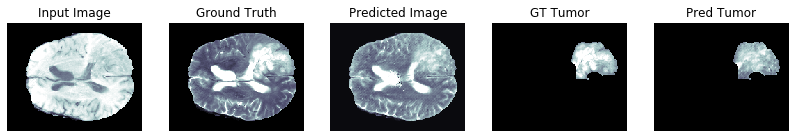

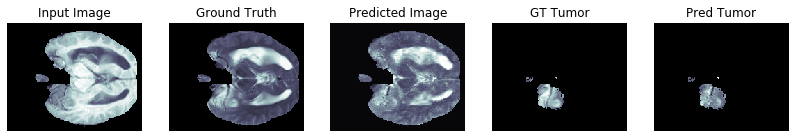

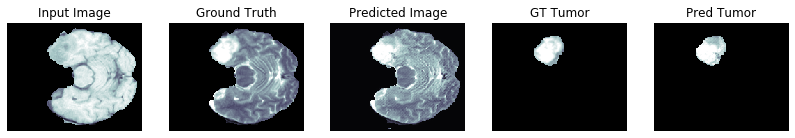

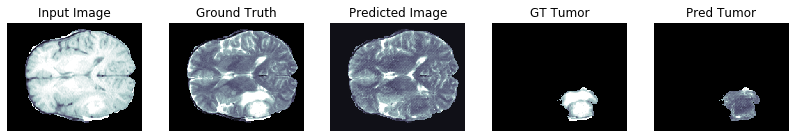

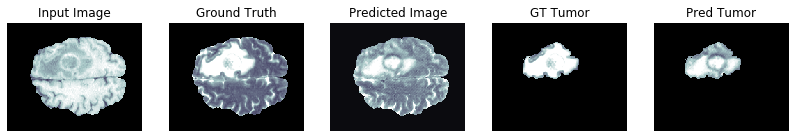

PSNR on validation set: 21.9011 ± 3.8247
MSE on validation set: 0.0085 ± 0.0060
SSIM on validation set: 0.7719 ± 0.1147

PSNR wrt tumor area on validation set: 31.1287 ± 12.5418
MSE wrt tumor area on validation set: 0.0028 ± 0.0035
SSIM wrt tumor area on validation set: 0.9504 ± 0.0487

Generator loss on validation set: 2.5975 ± 1.0035
Discriminator loss on validation set: 1.4567 ± 0.0333

Epoch:  36
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
........................................................................

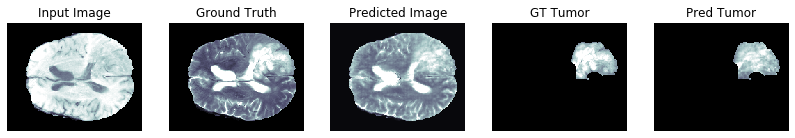

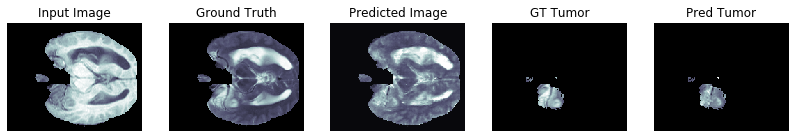

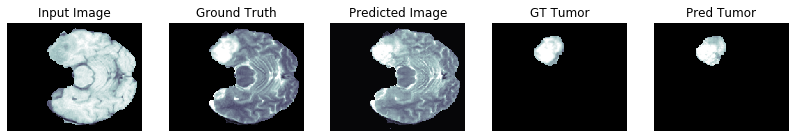

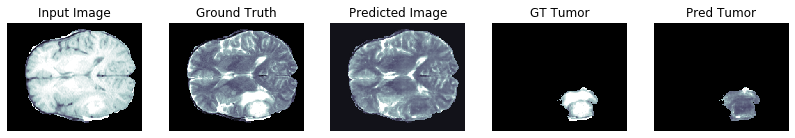

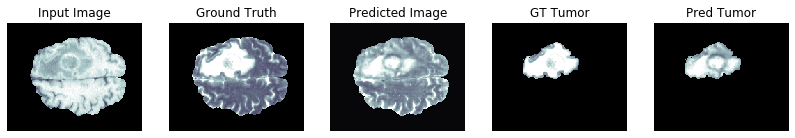

PSNR on validation set: 21.9653 ± 3.8803
MSE on validation set: 0.0086 ± 0.0065
SSIM on validation set: 0.7851 ± 0.1116

PSNR wrt tumor area on validation set: 31.4397 ± 12.4150
MSE wrt tumor area on validation set: 0.0026 ± 0.0033
SSIM wrt tumor area on validation set: 0.9540 ± 0.0454

Generator loss on validation set: 2.6673 ± 0.9136
Discriminator loss on validation set: 1.3619 ± 0.0134

Time taken for epoch 36 is 429.04484248161316 sec


Epoch:  37
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

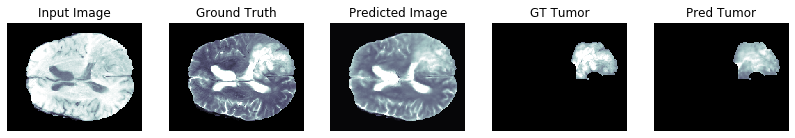

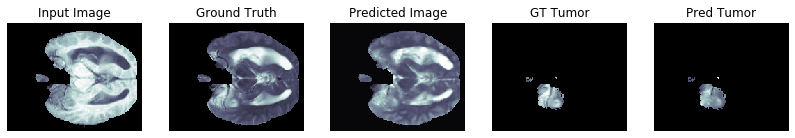

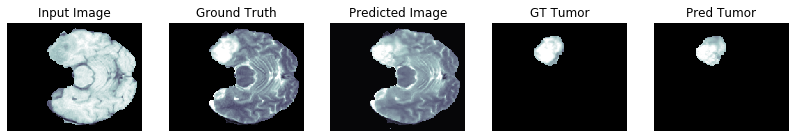

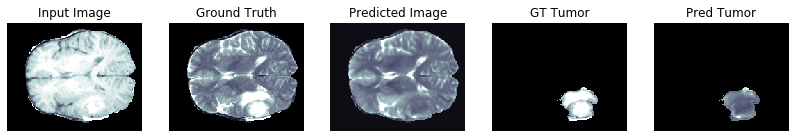

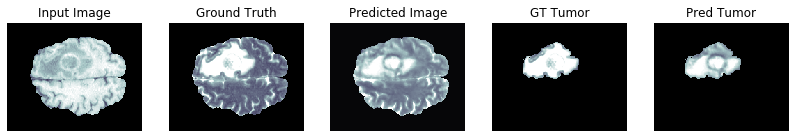

PSNR on validation set: 22.3842 ± 3.8690
MSE on validation set: 0.0077 ± 0.0058
SSIM on validation set: 0.8055 ± 0.1036

PSNR wrt tumor area on validation set: 31.7958 ± 12.3443
MSE wrt tumor area on validation set: 0.0025 ± 0.0034
SSIM wrt tumor area on validation set: 0.9561 ± 0.0458

Generator loss on validation set: 2.9094 ± 0.8370
Discriminator loss on validation set: 3.0418 ± 0.6580

Time taken for epoch 37 is 422.83638191223145 sec


Epoch:  38
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

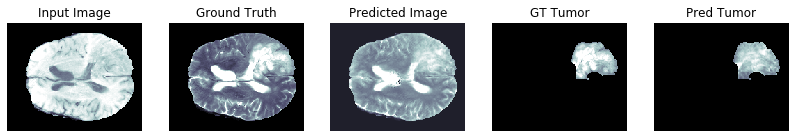

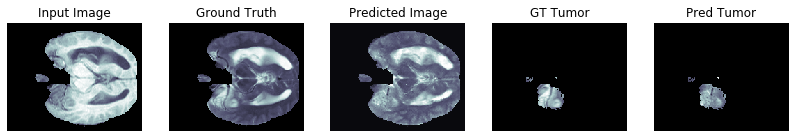

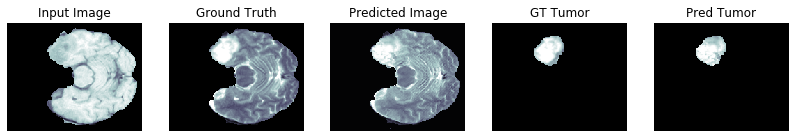

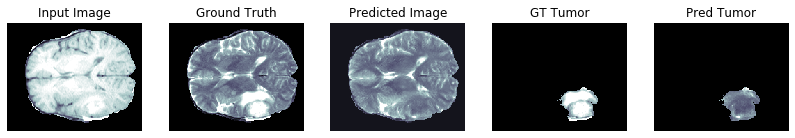

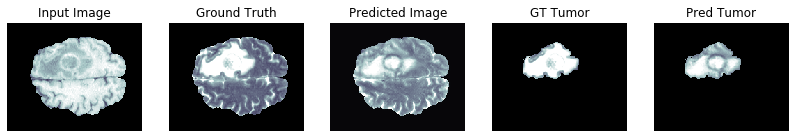

PSNR on validation set: 21.9102 ± 4.0312
MSE on validation set: 0.0089 ± 0.0071
SSIM on validation set: 0.7845 ± 0.1145

PSNR wrt tumor area on validation set: 31.3479 ± 12.5272
MSE wrt tumor area on validation set: 0.0028 ± 0.0037
SSIM wrt tumor area on validation set: 0.9511 ± 0.0509

Generator loss on validation set: 2.6161 ± 0.9543
Discriminator loss on validation set: 1.3866 ± 0.0055

Time taken for epoch 38 is 422.37383484840393 sec


Epoch:  39
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

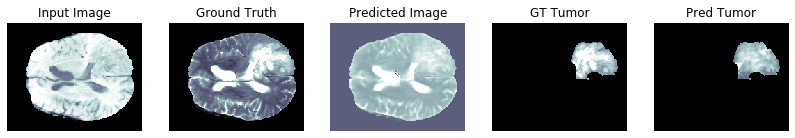

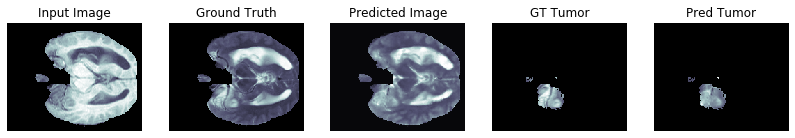

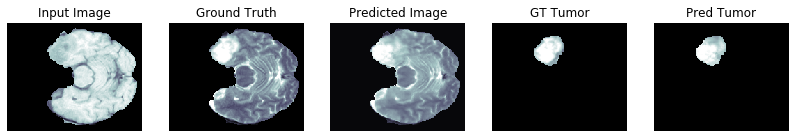

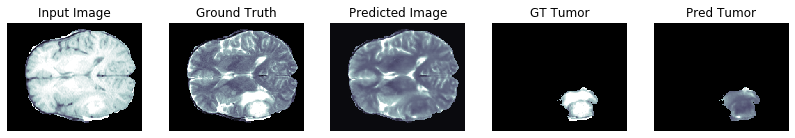

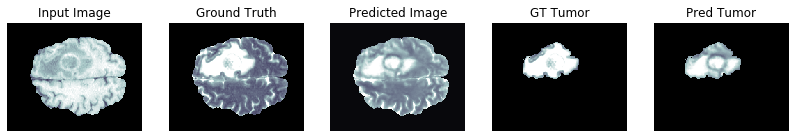

PSNR on validation set: 22.2646 ± 4.0856
MSE on validation set: 0.0083 ± 0.0070
SSIM on validation set: 0.8024 ± 0.1096

PSNR wrt tumor area on validation set: 31.8216 ± 12.8066
MSE wrt tumor area on validation set: 0.0026 ± 0.0038
SSIM wrt tumor area on validation set: 0.9546 ± 0.0513

Generator loss on validation set: 2.5809 ± 0.9377
Discriminator loss on validation set: 1.3891 ± 0.0021

Time taken for epoch 39 is 422.25871658325195 sec


Epoch:  40
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

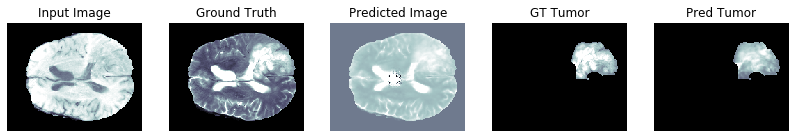

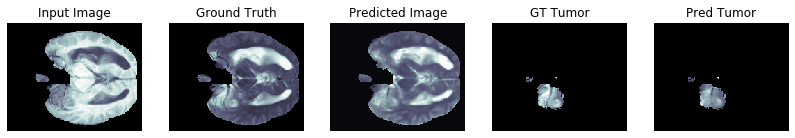

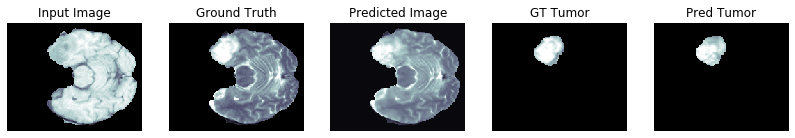

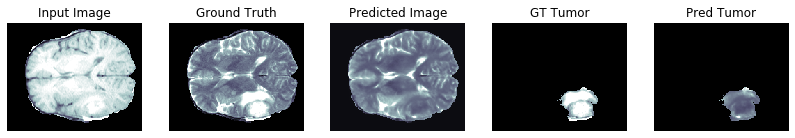

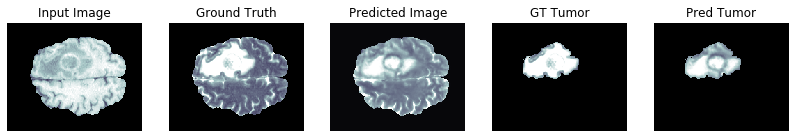

PSNR on validation set: 21.9697 ± 4.3345
MSE on validation set: 0.0095 ± 0.0088
SSIM on validation set: 0.7953 ± 0.1190

PSNR wrt tumor area on validation set: 31.4332 ± 13.1459
MSE wrt tumor area on validation set: 0.0031 ± 0.0048
SSIM wrt tumor area on validation set: 0.9475 ± 0.0653

Generator loss on validation set: 2.5287 ± 1.0233
Discriminator loss on validation set: 1.4243 ± 0.0091

Time taken for epoch 40 is 422.8166136741638 sec


Epoch:  41
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

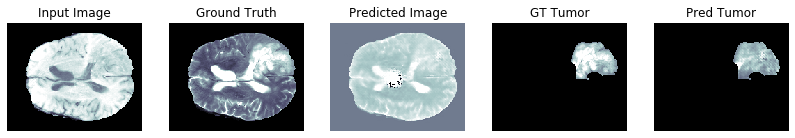

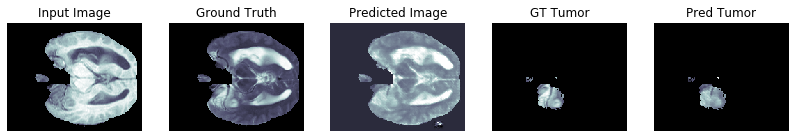

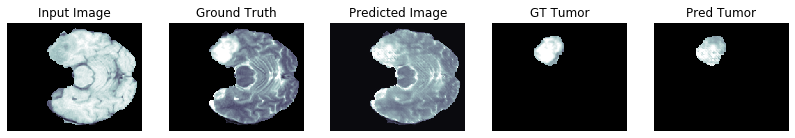

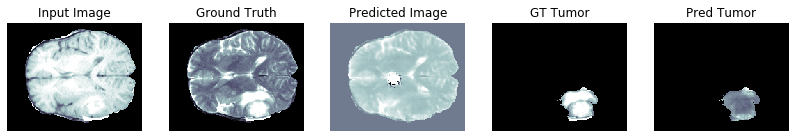

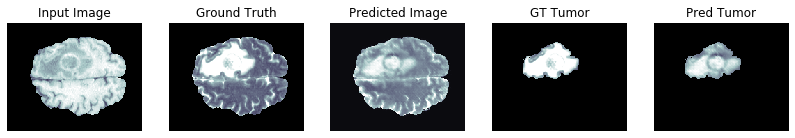

PSNR on validation set: 20.2037 ± 4.6492
MSE on validation set: 0.0153 ± 0.0144
SSIM on validation set: 0.7430 ± 0.1504

PSNR wrt tumor area on validation set: 30.1218 ± 13.2807
MSE wrt tumor area on validation set: 0.0051 ± 0.0083
SSIM wrt tumor area on validation set: 0.9168 ± 0.1109

Generator loss on validation set: 2.7716 ± 0.9994
Discriminator loss on validation set: 1.4022 ± 0.0067

Time taken for epoch 41 is 422.26510429382324 sec


Epoch:  42
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

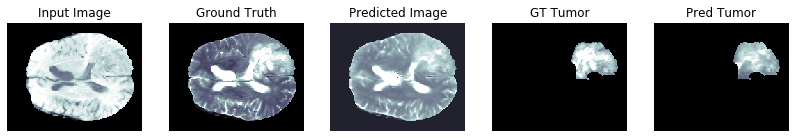

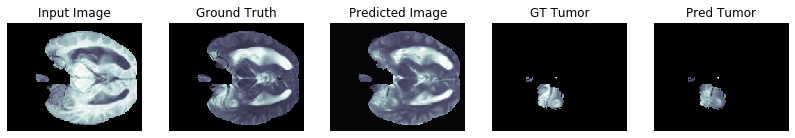

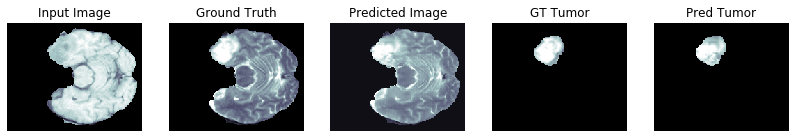

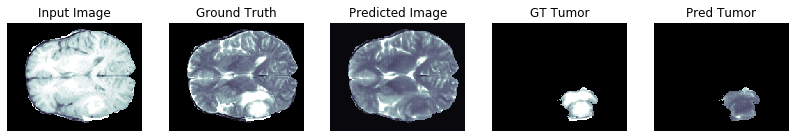

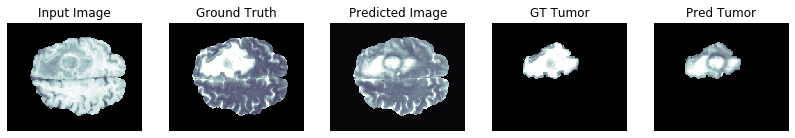

PSNR on validation set: 22.1347 ± 4.0118
MSE on validation set: 0.0084 ± 0.0063
SSIM on validation set: 0.7971 ± 0.1081

PSNR wrt tumor area on validation set: 31.2464 ± 13.0459
MSE wrt tumor area on validation set: 0.0029 ± 0.0038
SSIM wrt tumor area on validation set: 0.9499 ± 0.0503

Generator loss on validation set: 2.5882 ± 1.0200
Discriminator loss on validation set: 1.4056 ± 0.0087

Time taken for epoch 42 is 422.3849503993988 sec


Epoch:  43
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

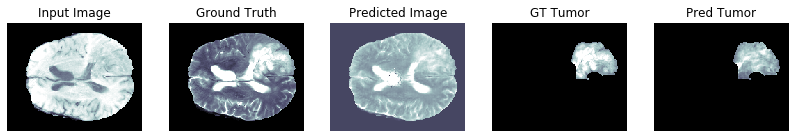

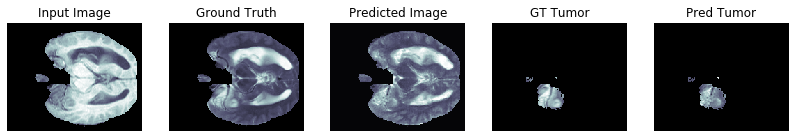

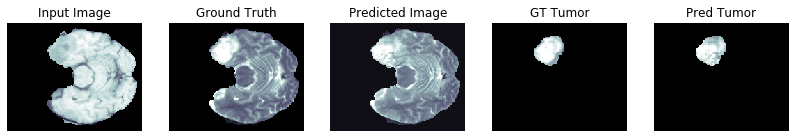

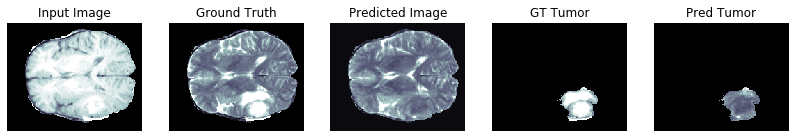

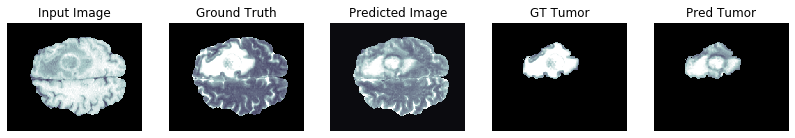

PSNR on validation set: 21.9028 ± 4.0059
MSE on validation set: 0.0089 ± 0.0070
SSIM on validation set: 0.7826 ± 0.1142

PSNR wrt tumor area on validation set: 31.0162 ± 12.4424
MSE wrt tumor area on validation set: 0.0029 ± 0.0037
SSIM wrt tumor area on validation set: 0.9487 ± 0.0509

Generator loss on validation set: 2.5484 ± 0.9846
Discriminator loss on validation set: 1.3969 ± 0.0057

Saving checkpoint for epoch 43 at ./drive/My Drive/checkpoints/train2/ckpt-6
Time taken for epoch 43 is 425.5806505680084 sec


Epoch:  44
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.................................................

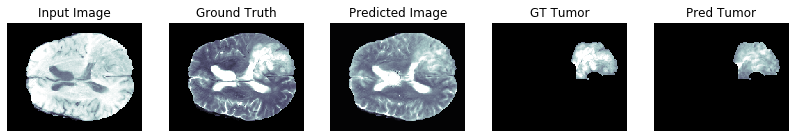

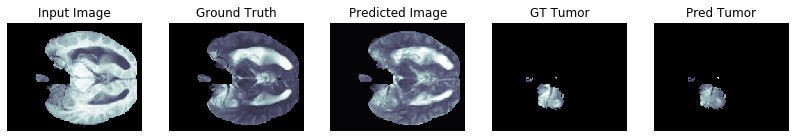

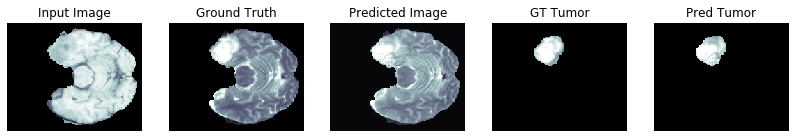

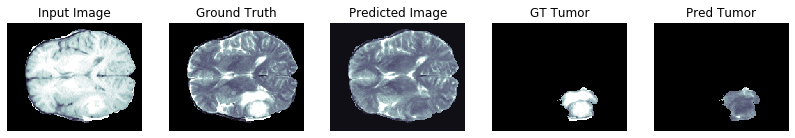

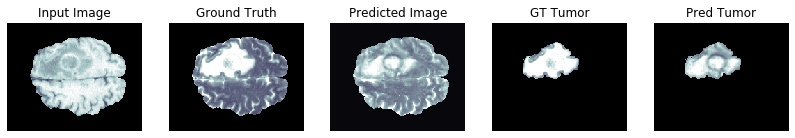

PSNR on validation set: 22.2385 ± 3.7721
MSE on validation set: 0.0079 ± 0.0055
SSIM on validation set: 0.7903 ± 0.1085

PSNR wrt tumor area on validation set: 31.6354 ± 12.8714
MSE wrt tumor area on validation set: 0.0025 ± 0.0032
SSIM wrt tumor area on validation set: 0.9548 ± 0.0450

Generator loss on validation set: 2.6674 ± 0.9049
Discriminator loss on validation set: 1.3960 ± 0.0055

Time taken for epoch 44 is 422.11484956741333 sec


Epoch:  45
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

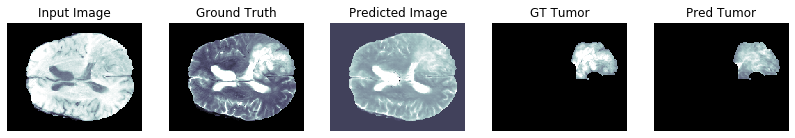

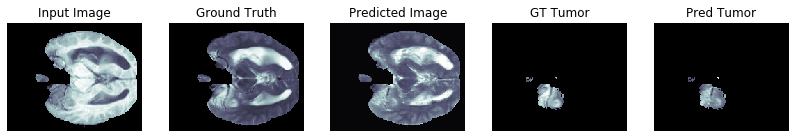

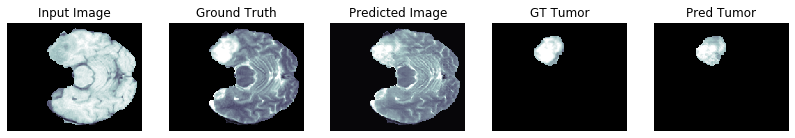

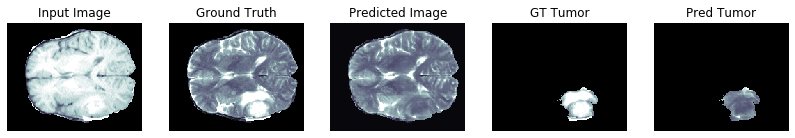

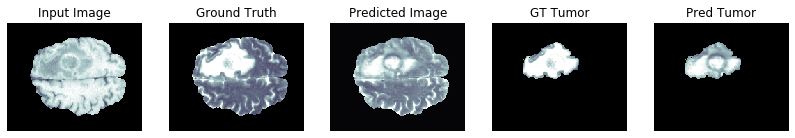

PSNR on validation set: 22.2189 ± 3.9047
MSE on validation set: 0.0080 ± 0.0058
SSIM on validation set: 0.7938 ± 0.1090

PSNR wrt tumor area on validation set: 31.5398 ± 12.3525
MSE wrt tumor area on validation set: 0.0025 ± 0.0033
SSIM wrt tumor area on validation set: 0.9544 ± 0.0452

Generator loss on validation set: 2.6325 ± 0.8961
Discriminator loss on validation set: 1.4214 ± 0.0121

Time taken for epoch 45 is 422.3176107406616 sec


Epoch:  46
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

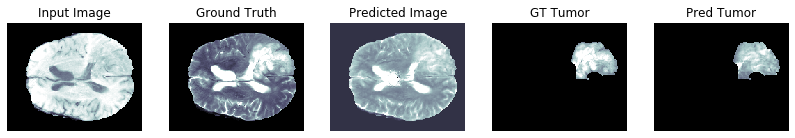

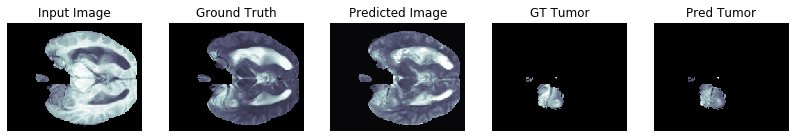

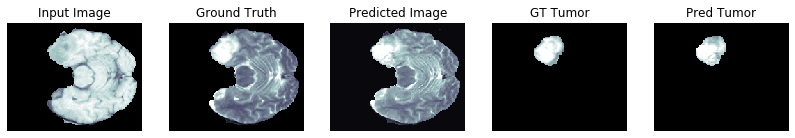

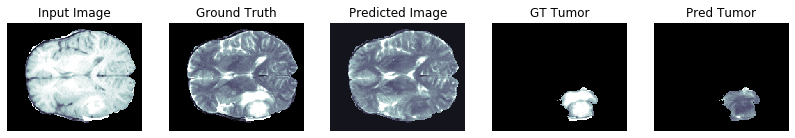

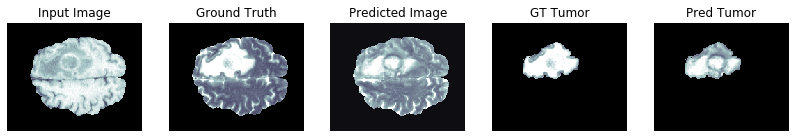

PSNR on validation set: 22.0683 ± 3.8460
MSE on validation set: 0.0082 ± 0.0057
SSIM on validation set: 0.7876 ± 0.1087

PSNR wrt tumor area on validation set: 31.2887 ± 12.7437
MSE wrt tumor area on validation set: 0.0027 ± 0.0034
SSIM wrt tumor area on validation set: 0.9519 ± 0.0476

Generator loss on validation set: 2.6072 ± 0.9438
Discriminator loss on validation set: 1.3856 ± 0.0034

Time taken for epoch 46 is 421.99354553222656 sec


Epoch:  47
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

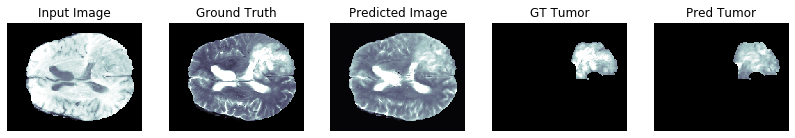

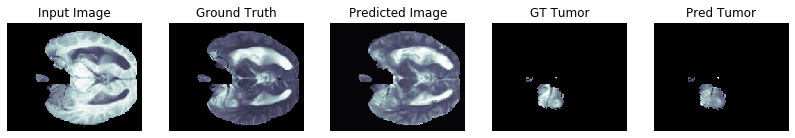

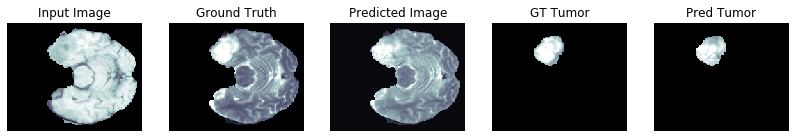

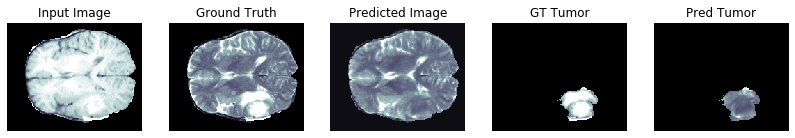

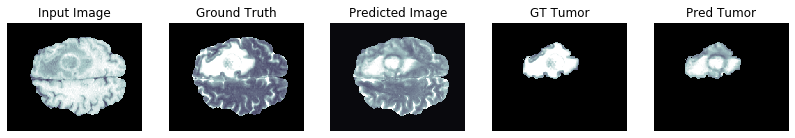

PSNR on validation set: 22.2256 ± 3.8009
MSE on validation set: 0.0079 ± 0.0055
SSIM on validation set: 0.7928 ± 0.1066

PSNR wrt tumor area on validation set: 31.5144 ± 12.1242
MSE wrt tumor area on validation set: 0.0025 ± 0.0033
SSIM wrt tumor area on validation set: 0.9544 ± 0.0454

Generator loss on validation set: 2.6408 ± 0.9455
Discriminator loss on validation set: 1.3976 ± 0.0104

Time taken for epoch 47 is 422.07093262672424 sec


Epoch:  48
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

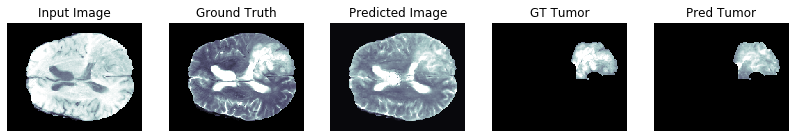

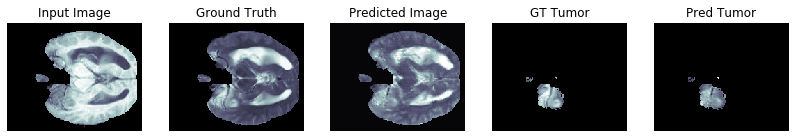

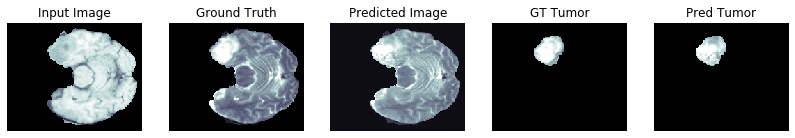

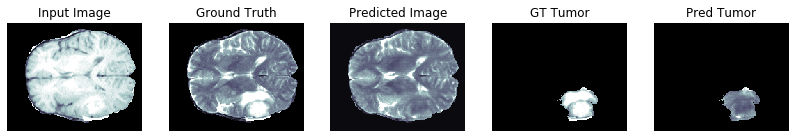

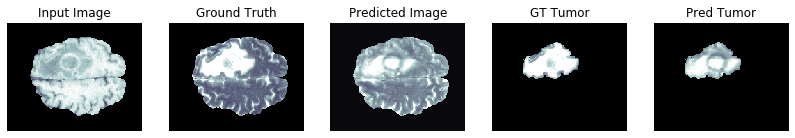

PSNR on validation set: 22.1638 ± 3.7882
MSE on validation set: 0.0080 ± 0.0055
SSIM on validation set: 0.7883 ± 0.1082

PSNR wrt tumor area on validation set: 31.2691 ± 10.9424
MSE wrt tumor area on validation set: 0.0026 ± 0.0033
SSIM wrt tumor area on validation set: 0.9537 ± 0.0457

Generator loss on validation set: 2.5435 ± 0.9294
Discriminator loss on validation set: 1.3877 ± 0.0065

Time taken for epoch 48 is 422.53434801101685 sec


Epoch:  49
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

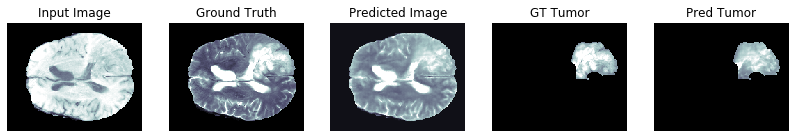

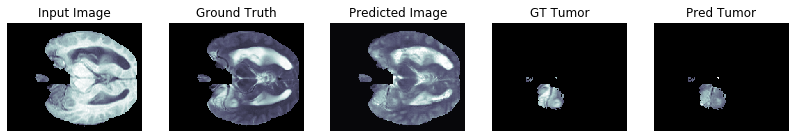

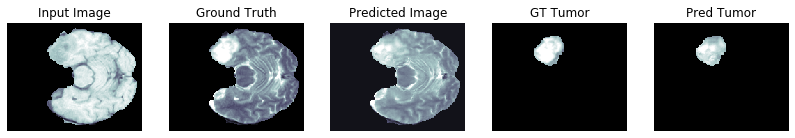

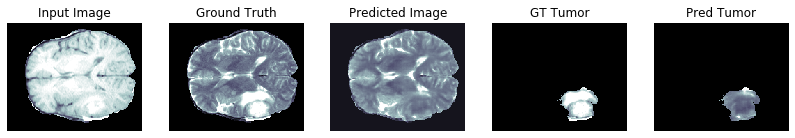

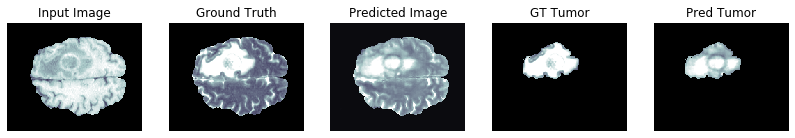

PSNR on validation set: 22.1241 ± 3.8664
MSE on validation set: 0.0082 ± 0.0061
SSIM on validation set: 0.7948 ± 0.1075

PSNR wrt tumor area on validation set: 31.8852 ± 12.4876
MSE wrt tumor area on validation set: 0.0024 ± 0.0031
SSIM wrt tumor area on validation set: 0.9577 ± 0.0428

Generator loss on validation set: 4.4469 ± 1.7344
Discriminator loss on validation set: 3.1420 ± 0.8084

Time taken for epoch 49 is 422.15007972717285 sec


Epoch:  50
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

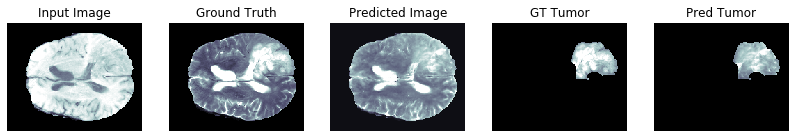

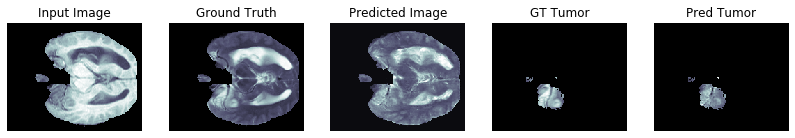

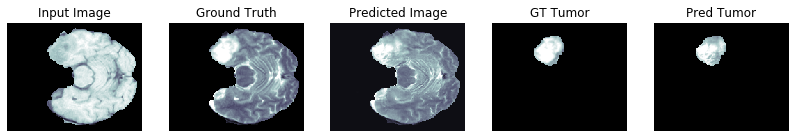

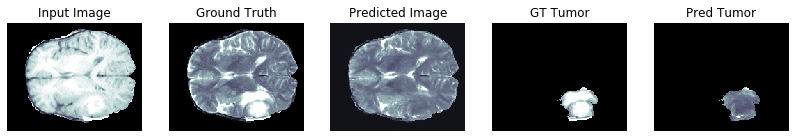

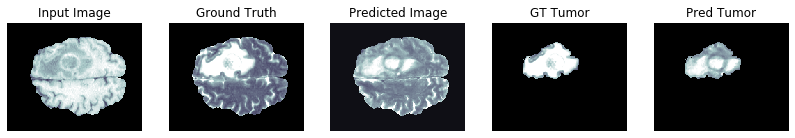

PSNR on validation set: 21.6166 ± 3.7751
MSE on validation set: 0.0091 ± 0.0062
SSIM on validation set: 0.7762 ± 0.1119

PSNR wrt tumor area on validation set: 30.5965 ± 12.9246
MSE wrt tumor area on validation set: 0.0032 ± 0.0040
SSIM wrt tumor area on validation set: 0.9439 ± 0.0539

Generator loss on validation set: 2.6349 ± 1.0272
Discriminator loss on validation set: 1.4001 ± 0.0114

Time taken for epoch 50 is 421.822163105011 sec


Epoch:  51
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

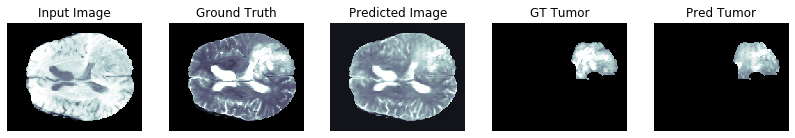

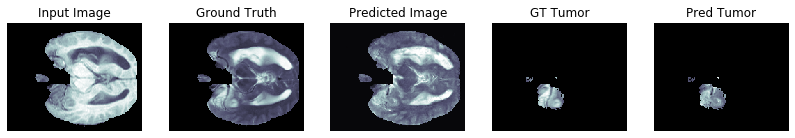

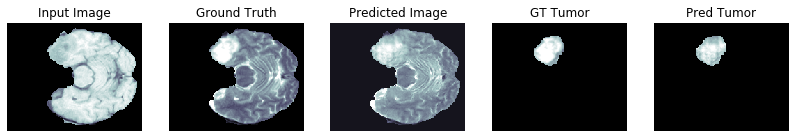

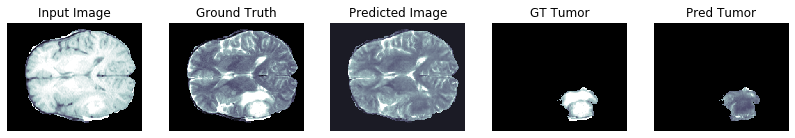

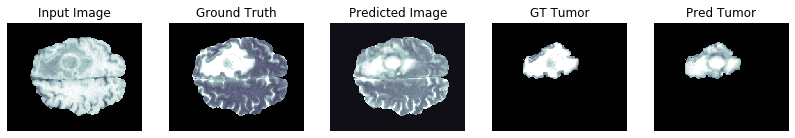

PSNR on validation set: 21.7474 ± 3.6641
MSE on validation set: 0.0087 ± 0.0059
SSIM on validation set: 0.7826 ± 0.1091

PSNR wrt tumor area on validation set: 31.0508 ± 10.8870
MSE wrt tumor area on validation set: 0.0026 ± 0.0033
SSIM wrt tumor area on validation set: 0.9537 ± 0.0457

Generator loss on validation set: 2.4298 ± 0.9678
Discriminator loss on validation set: 1.4976 ± 0.0285

Saving checkpoint for epoch 51 at ./drive/My Drive/checkpoints/train2/ckpt-7
Time taken for epoch 51 is 425.8620889186859 sec


Epoch:  52
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.................................................

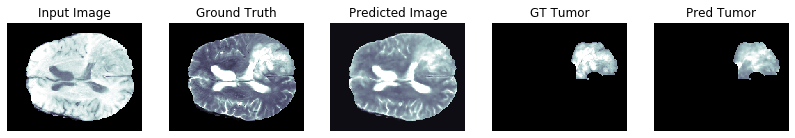

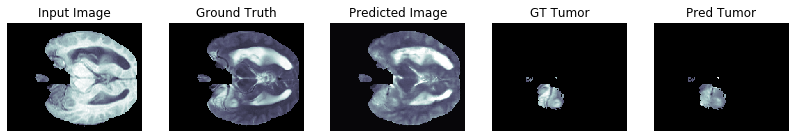

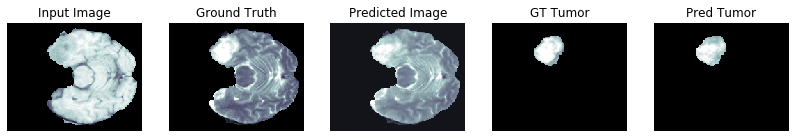

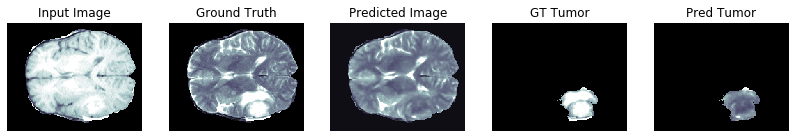

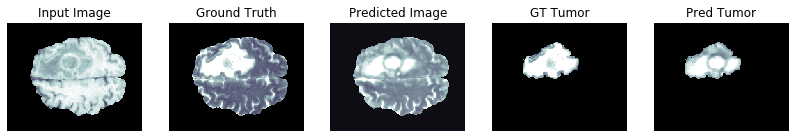

PSNR on validation set: 22.0649 ± 3.9519
MSE on validation set: 0.0086 ± 0.0069
SSIM on validation set: 0.7965 ± 0.1089

PSNR wrt tumor area on validation set: 31.5156 ± 12.5120
MSE wrt tumor area on validation set: 0.0027 ± 0.0037
SSIM wrt tumor area on validation set: 0.9528 ± 0.0519

Generator loss on validation set: 2.8940 ± 1.0936
Discriminator loss on validation set: 1.6566 ± 0.1547

Time taken for epoch 52 is 421.8947563171387 sec


Epoch:  53
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

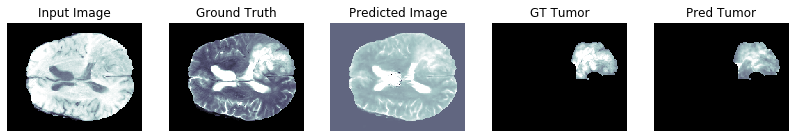

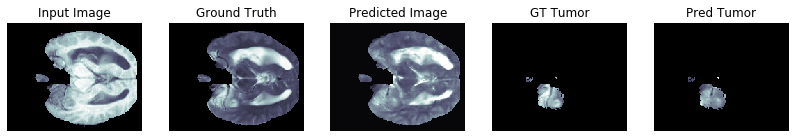

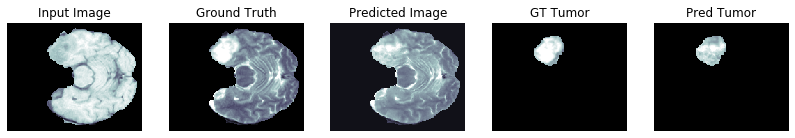

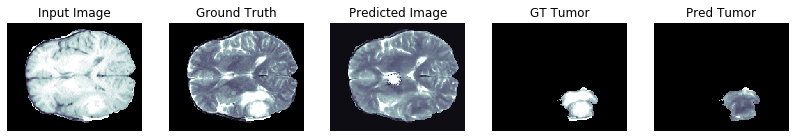

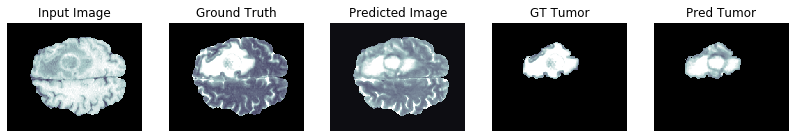

PSNR on validation set: 21.6792 ± 4.3244
MSE on validation set: 0.0101 ± 0.0092
SSIM on validation set: 0.7835 ± 0.1236

PSNR wrt tumor area on validation set: 31.1745 ± 12.8559
MSE wrt tumor area on validation set: 0.0030 ± 0.0043
SSIM wrt tumor area on validation set: 0.9484 ± 0.0581

Generator loss on validation set: 2.6078 ± 0.9764
Discriminator loss on validation set: 1.4188 ± 0.0178

Time taken for epoch 53 is 422.0760669708252 sec


Epoch:  54
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

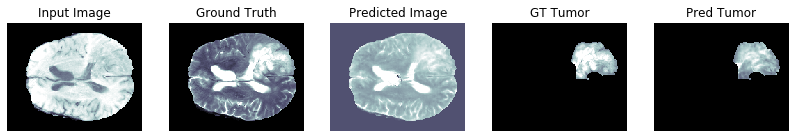

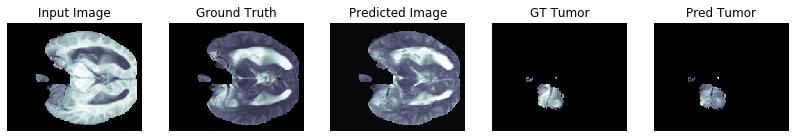

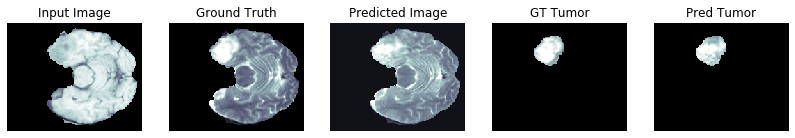

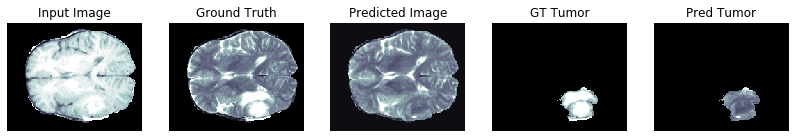

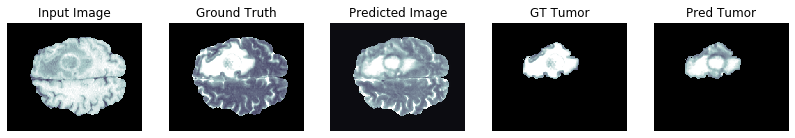

PSNR on validation set: 21.8391 ± 4.1739
MSE on validation set: 0.0094 ± 0.0082
SSIM on validation set: 0.7838 ± 0.1189

PSNR wrt tumor area on validation set: 31.2523 ± 12.6028
MSE wrt tumor area on validation set: 0.0029 ± 0.0040
SSIM wrt tumor area on validation set: 0.9495 ± 0.0560

Generator loss on validation set: 2.7156 ± 0.9656
Discriminator loss on validation set: 1.4241 ± 0.0227

Time taken for epoch 54 is 422.02083253860474 sec


Epoch:  55
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

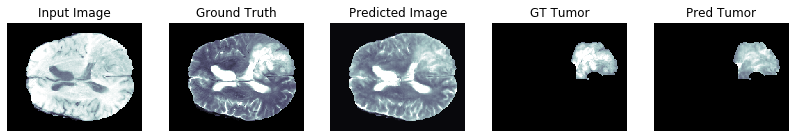

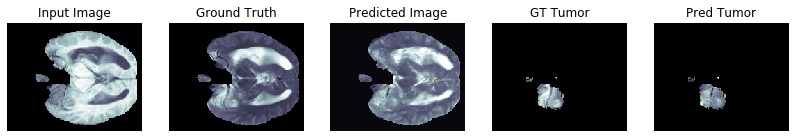

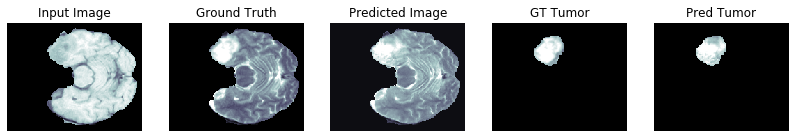

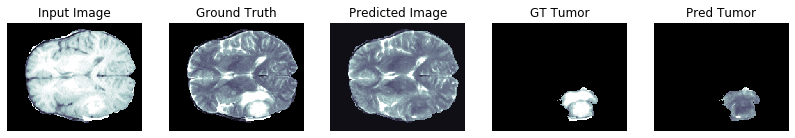

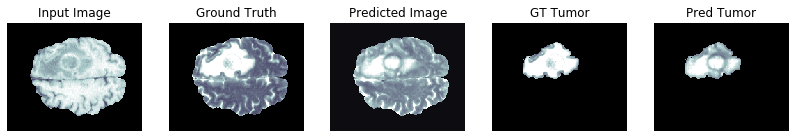

PSNR on validation set: 22.2835 ± 3.7892
MSE on validation set: 0.0078 ± 0.0054
SSIM on validation set: 0.7928 ± 0.1076

PSNR wrt tumor area on validation set: 31.5666 ± 12.0588
MSE wrt tumor area on validation set: 0.0025 ± 0.0031
SSIM wrt tumor area on validation set: 0.9554 ± 0.0437

Generator loss on validation set: 2.5287 ± 0.8905
Discriminator loss on validation set: 1.4012 ± 0.0119

Time taken for epoch 55 is 421.94724225997925 sec


Epoch:  56
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

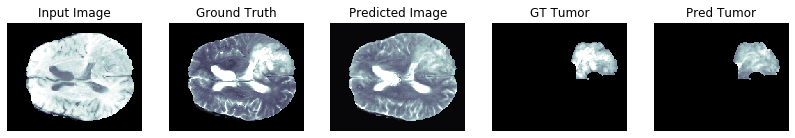

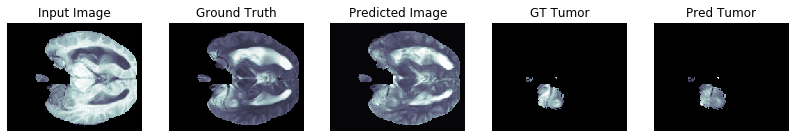

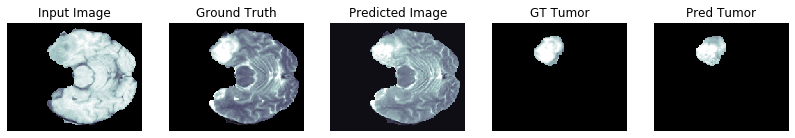

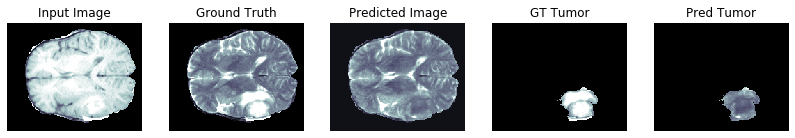

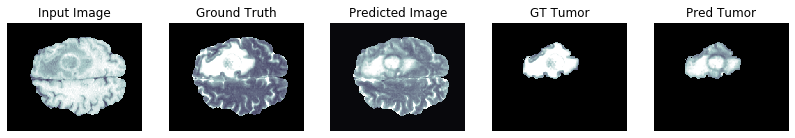

PSNR on validation set: 22.1559 ± 3.8550
MSE on validation set: 0.0081 ± 0.0057
SSIM on validation set: 0.7900 ± 0.1082

PSNR wrt tumor area on validation set: 31.2165 ± 11.5073
MSE wrt tumor area on validation set: 0.0027 ± 0.0034
SSIM wrt tumor area on validation set: 0.9524 ± 0.0470

Generator loss on validation set: 2.5951 ± 0.9876
Discriminator loss on validation set: 1.3957 ± 0.0213

Time taken for epoch 56 is 421.9125072956085 sec


Epoch:  57
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

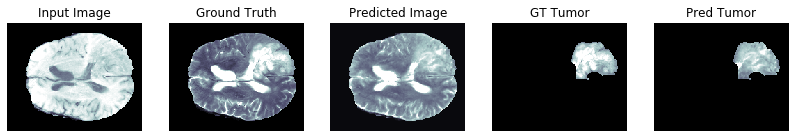

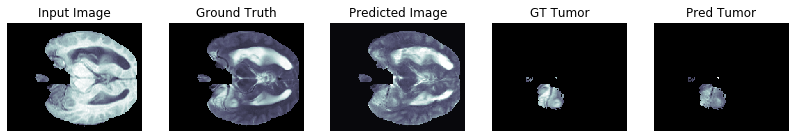

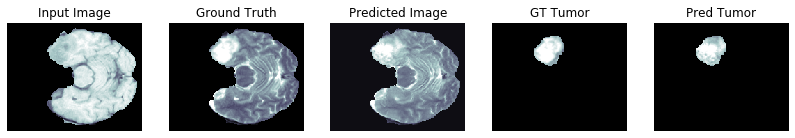

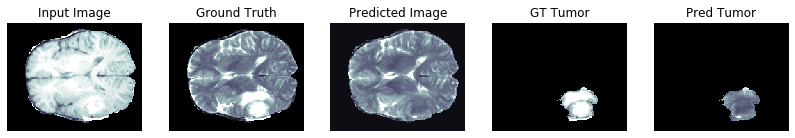

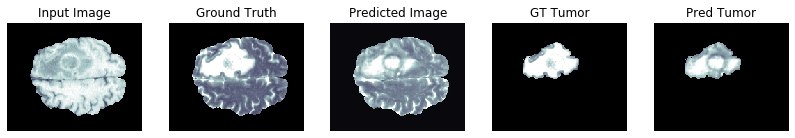

PSNR on validation set: 22.1461 ± 3.8152
MSE on validation set: 0.0081 ± 0.0057
SSIM on validation set: 0.7893 ± 0.1076

PSNR wrt tumor area on validation set: 31.2956 ± 12.8133
MSE wrt tumor area on validation set: 0.0027 ± 0.0035
SSIM wrt tumor area on validation set: 0.9519 ± 0.0477

Generator loss on validation set: 2.7274 ± 0.9211
Discriminator loss on validation set: 1.4459 ± 0.0160

Time taken for epoch 57 is 421.7029492855072 sec


Epoch:  58
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

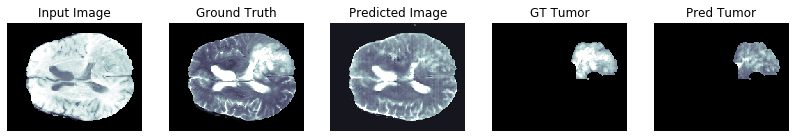

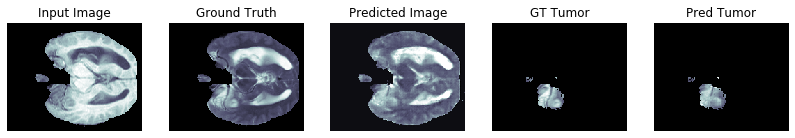

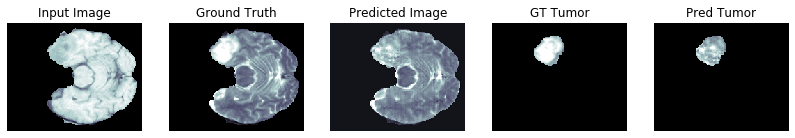

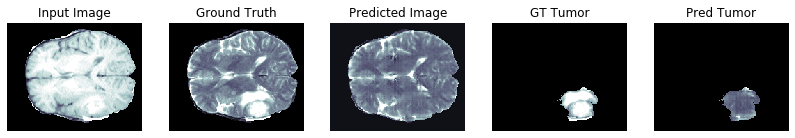

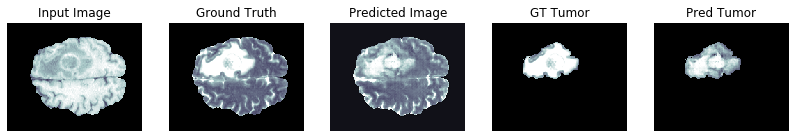

PSNR on validation set: 20.9628 ± 3.8913
MSE on validation set: 0.0109 ± 0.0083
SSIM on validation set: 0.7682 ± 0.1201

PSNR wrt tumor area on validation set: 30.1093 ± 13.2731
MSE wrt tumor area on validation set: 0.0039 ± 0.0050
SSIM wrt tumor area on validation set: 0.9352 ± 0.0645

Generator loss on validation set: 2.7254 ± 1.2219
Discriminator loss on validation set: 1.6770 ± 0.0784

Time taken for epoch 58 is 421.7320411205292 sec


Epoch:  59
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

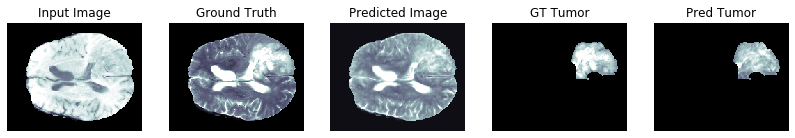

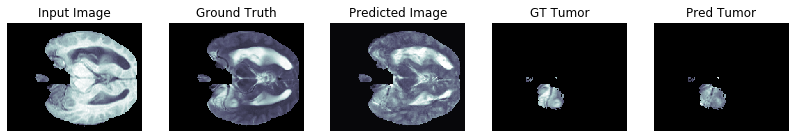

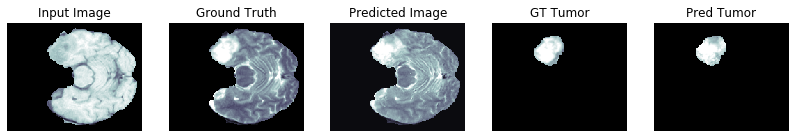

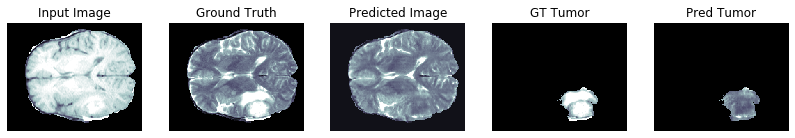

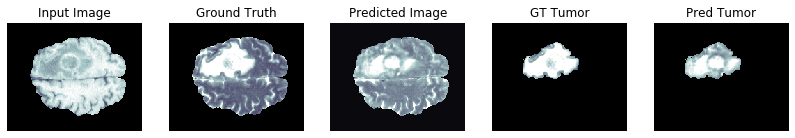

PSNR on validation set: 21.9672 ± 3.7642
MSE on validation set: 0.0084 ± 0.0058
SSIM on validation set: 0.7848 ± 0.1080

PSNR wrt tumor area on validation set: 31.2659 ± 11.4401
MSE wrt tumor area on validation set: 0.0026 ± 0.0033
SSIM wrt tumor area on validation set: 0.9536 ± 0.0458

Generator loss on validation set: 2.3529 ± 0.9415
Discriminator loss on validation set: 1.4852 ± 0.0132

Saving checkpoint for epoch 59 at ./drive/My Drive/checkpoints/train2/ckpt-8
Time taken for epoch 59 is 424.87635111808777 sec


Epoch:  60
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
................................................

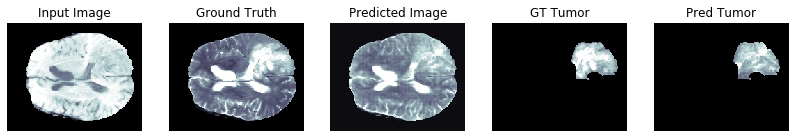

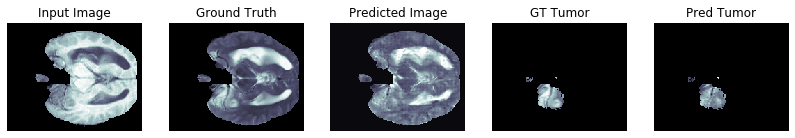

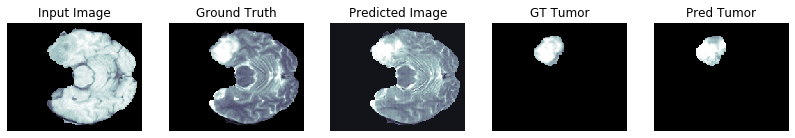

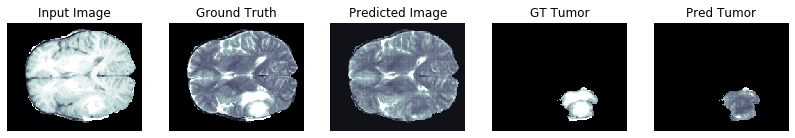

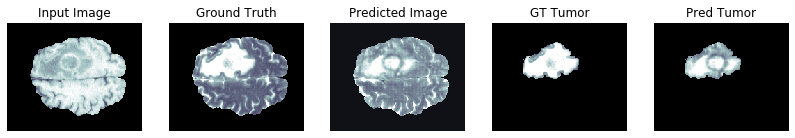

PSNR on validation set: 21.7986 ± 3.8451
MSE on validation set: 0.0088 ± 0.0061
SSIM on validation set: 0.7789 ± 0.1105

PSNR wrt tumor area on validation set: 30.9509 ± 11.2805
MSE wrt tumor area on validation set: 0.0027 ± 0.0034
SSIM wrt tumor area on validation set: 0.9512 ± 0.0469

Generator loss on validation set: 2.5103 ± 0.9610
Discriminator loss on validation set: 1.3944 ± 0.0194

Time taken for epoch 60 is 421.9401047229767 sec


Epoch:  61
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

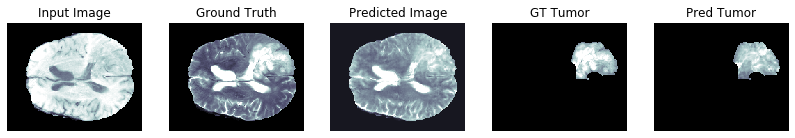

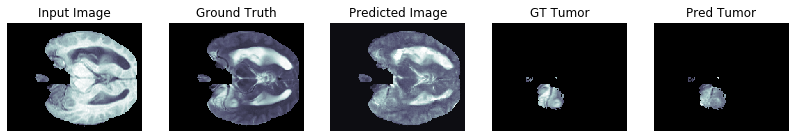

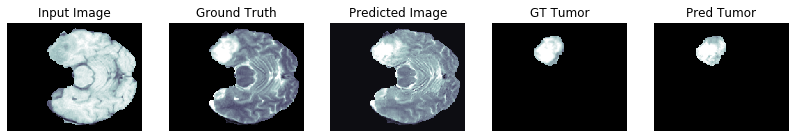

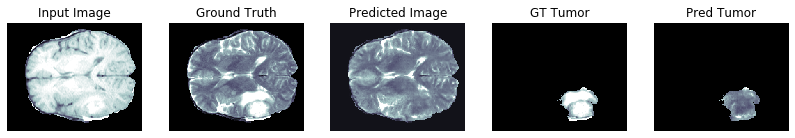

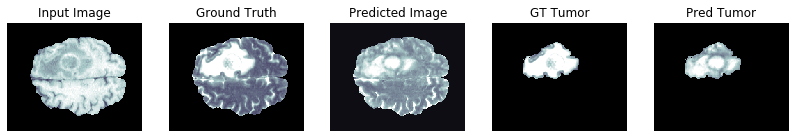

PSNR on validation set: 21.9544 ± 3.7485
MSE on validation set: 0.0083 ± 0.0057
SSIM on validation set: 0.7843 ± 0.1091

PSNR wrt tumor area on validation set: 31.1782 ± 10.8154
MSE wrt tumor area on validation set: 0.0026 ± 0.0033
SSIM wrt tumor area on validation set: 0.9536 ± 0.0457

Generator loss on validation set: 2.5655 ± 0.9909
Discriminator loss on validation set: 1.5122 ± 0.0246

Time taken for epoch 61 is 421.94258189201355 sec


Epoch:  62
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

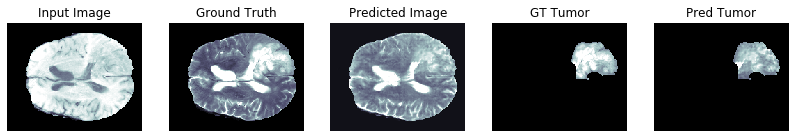

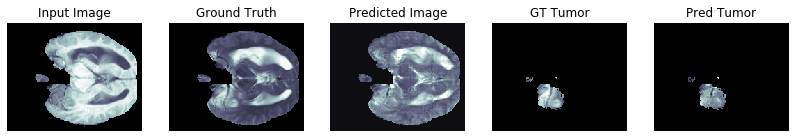

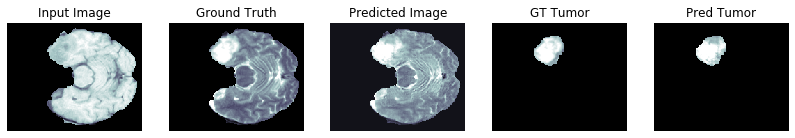

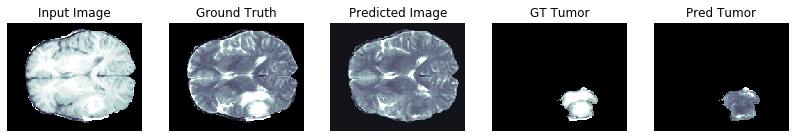

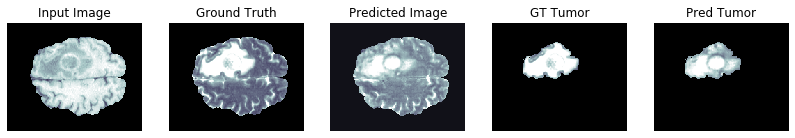

PSNR on validation set: 21.7680 ± 3.7137
MSE on validation set: 0.0087 ± 0.0060
SSIM on validation set: 0.7787 ± 0.1099

PSNR wrt tumor area on validation set: 30.7740 ± 10.0140
MSE wrt tumor area on validation set: 0.0028 ± 0.0035
SSIM wrt tumor area on validation set: 0.9511 ± 0.0478

Generator loss on validation set: 2.4853 ± 0.9873
Discriminator loss on validation set: 1.5613 ± 0.0484

Time taken for epoch 62 is 422.5188252925873 sec


Epoch:  63
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

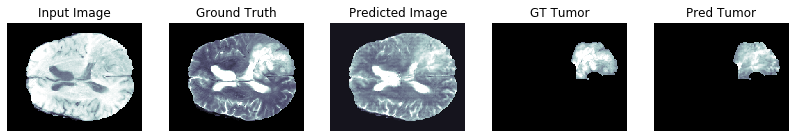

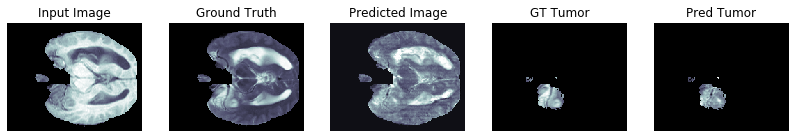

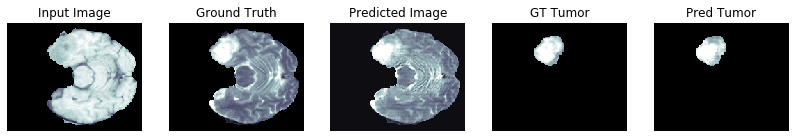

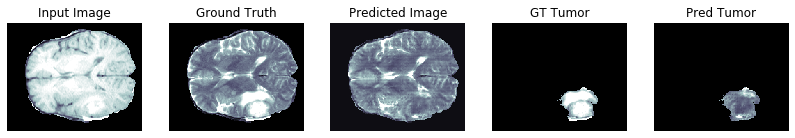

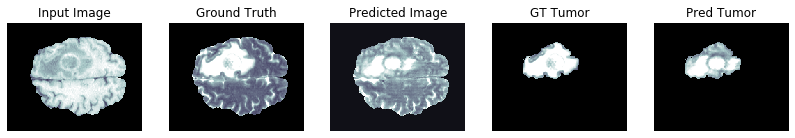

PSNR on validation set: 21.6902 ± 3.7006
MSE on validation set: 0.0088 ± 0.0060
SSIM on validation set: 0.7728 ± 0.1113

PSNR wrt tumor area on validation set: 31.2187 ± 12.0071
MSE wrt tumor area on validation set: 0.0025 ± 0.0033
SSIM wrt tumor area on validation set: 0.9545 ± 0.0446

Generator loss on validation set: 2.6015 ± 1.0094
Discriminator loss on validation set: 1.4681 ± 0.0232

Time taken for epoch 63 is 421.92483282089233 sec


Epoch:  64
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

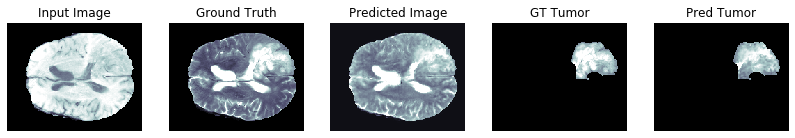

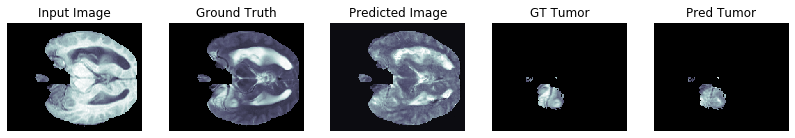

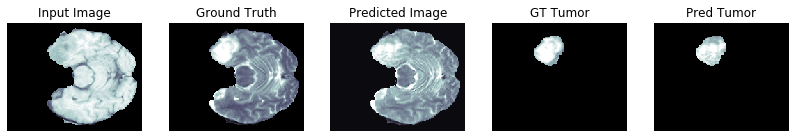

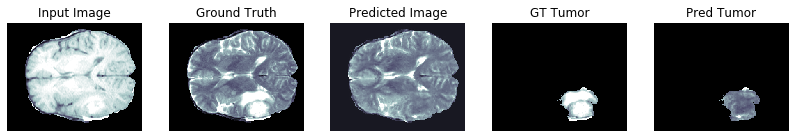

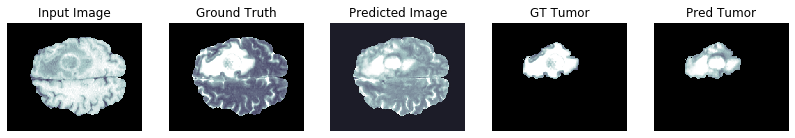

PSNR on validation set: 21.7076 ± 3.7837
MSE on validation set: 0.0089 ± 0.0064
SSIM on validation set: 0.7786 ± 0.1121

PSNR wrt tumor area on validation set: 31.3228 ± 11.8487
MSE wrt tumor area on validation set: 0.0026 ± 0.0034
SSIM wrt tumor area on validation set: 0.9532 ± 0.0468

Generator loss on validation set: 2.3212 ± 0.9243
Discriminator loss on validation set: 1.6671 ± 0.0664

Time taken for epoch 64 is 422.03322768211365 sec


Epoch:  65
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

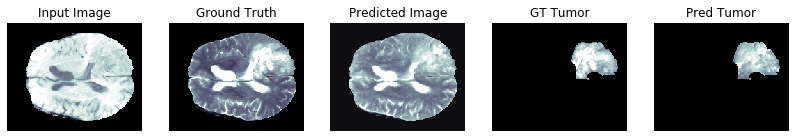

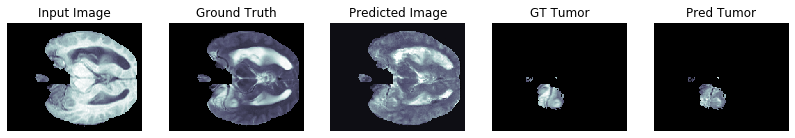

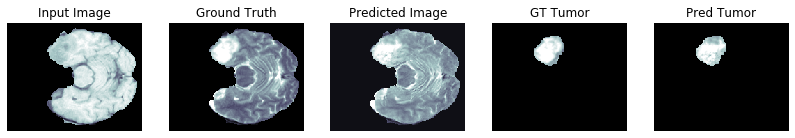

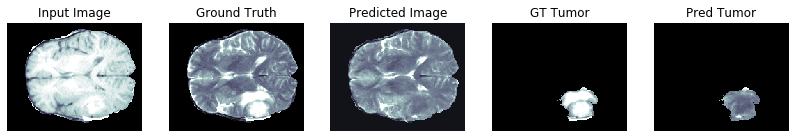

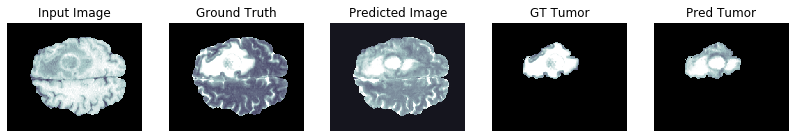

PSNR on validation set: 21.6901 ± 3.6633
MSE on validation set: 0.0088 ± 0.0059
SSIM on validation set: 0.7789 ± 0.1091

PSNR wrt tumor area on validation set: 31.3707 ± 12.4015
MSE wrt tumor area on validation set: 0.0025 ± 0.0032
SSIM wrt tumor area on validation set: 0.9545 ± 0.0439

Generator loss on validation set: 2.3515 ± 0.9177
Discriminator loss on validation set: 1.5758 ± 0.0402

Time taken for epoch 65 is 422.59207344055176 sec


Epoch:  66
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

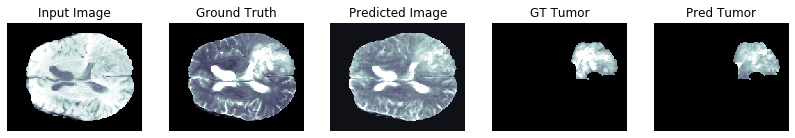

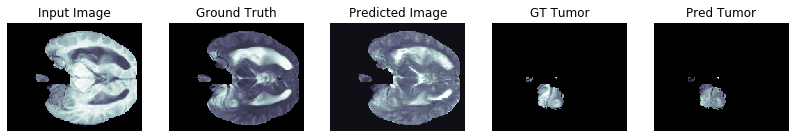

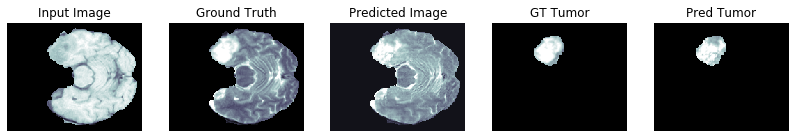

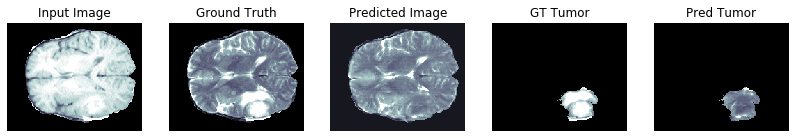

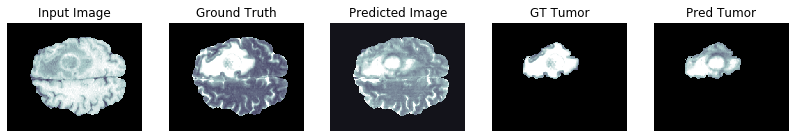

PSNR on validation set: 21.6133 ± 3.6876
MSE on validation set: 0.0090 ± 0.0061
SSIM on validation set: 0.7748 ± 0.1113

PSNR wrt tumor area on validation set: 31.2007 ± 12.2510
MSE wrt tumor area on validation set: 0.0026 ± 0.0032
SSIM wrt tumor area on validation set: 0.9529 ± 0.0450

Generator loss on validation set: 2.4376 ± 0.9956
Discriminator loss on validation set: 1.6117 ± 0.0485

Time taken for epoch 66 is 422.031893491745 sec


Epoch:  67
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

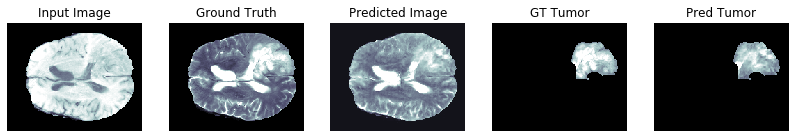

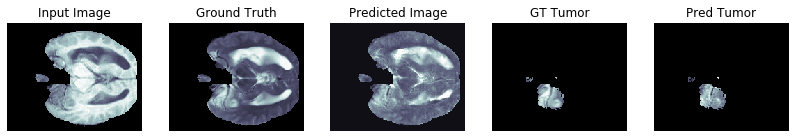

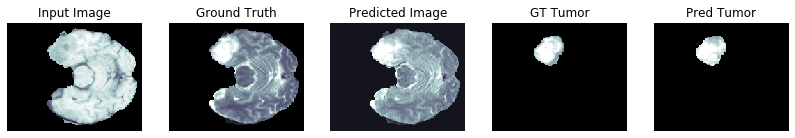

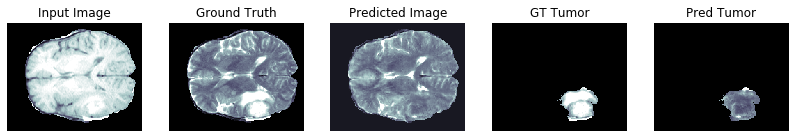

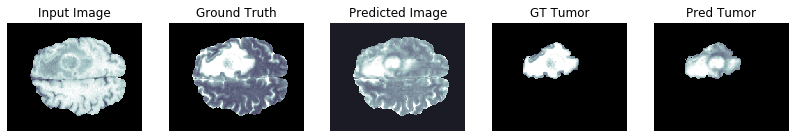

PSNR on validation set: 21.6252 ± 3.7468
MSE on validation set: 0.0091 ± 0.0063
SSIM on validation set: 0.7715 ± 0.1143

PSNR wrt tumor area on validation set: 31.0094 ± 12.3362
MSE wrt tumor area on validation set: 0.0028 ± 0.0037
SSIM wrt tumor area on validation set: 0.9508 ± 0.0494

Generator loss on validation set: 2.3724 ± 1.0319
Discriminator loss on validation set: 1.7366 ± 0.0739

Saving checkpoint for epoch 67 at ./drive/My Drive/checkpoints/train2/ckpt-9
Time taken for epoch 67 is 424.79174065589905 sec


Epoch:  68
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
................................................

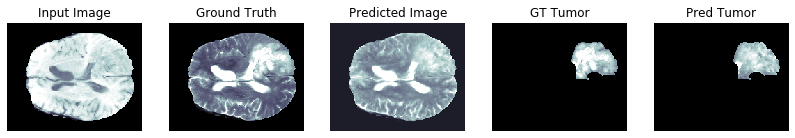

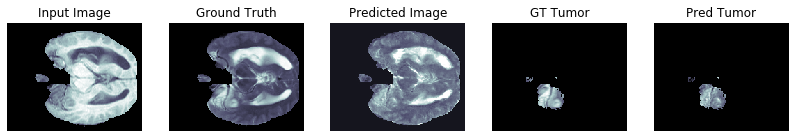

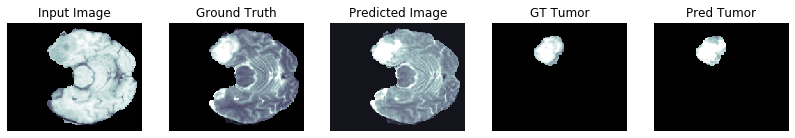

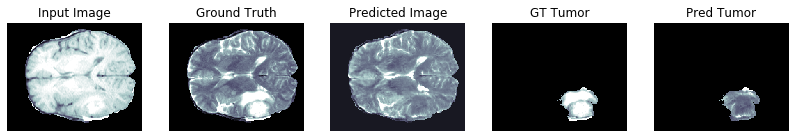

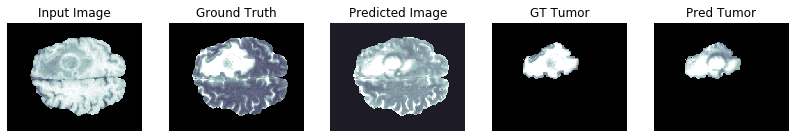

PSNR on validation set: 21.5025 ± 3.6276
MSE on validation set: 0.0091 ± 0.0061
SSIM on validation set: 0.7738 ± 0.1101

PSNR wrt tumor area on validation set: 31.2979 ± 12.3990
MSE wrt tumor area on validation set: 0.0024 ± 0.0030
SSIM wrt tumor area on validation set: 0.9554 ± 0.0420

Generator loss on validation set: 2.3376 ± 0.9317
Discriminator loss on validation set: 1.6390 ± 0.0336

Time taken for epoch 68 is 422.2653524875641 sec


Epoch:  69
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

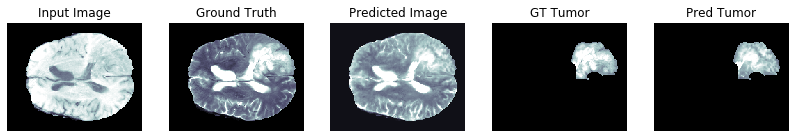

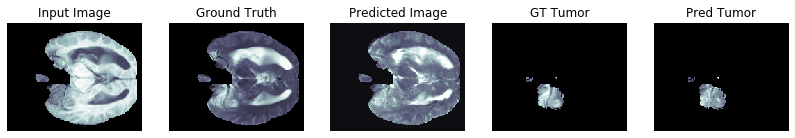

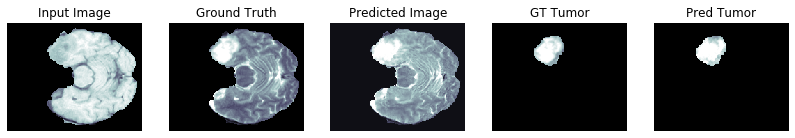

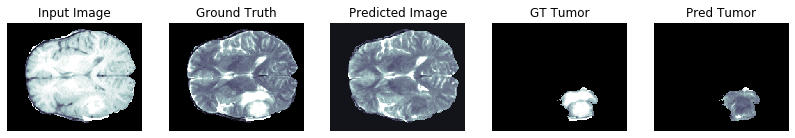

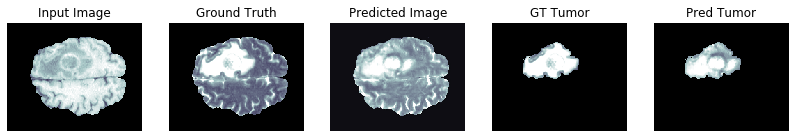

PSNR on validation set: 21.8375 ± 3.6319
MSE on validation set: 0.0084 ± 0.0055
SSIM on validation set: 0.7799 ± 0.1095

PSNR wrt tumor area on validation set: 31.6262 ± 11.8846
MSE wrt tumor area on validation set: 0.0023 ± 0.0029
SSIM wrt tumor area on validation set: 0.9574 ± 0.0412

Generator loss on validation set: 2.5608 ± 0.9329
Discriminator loss on validation set: 1.4406 ± 0.0264

Time taken for epoch 69 is 422.0134663581848 sec


Epoch:  70
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

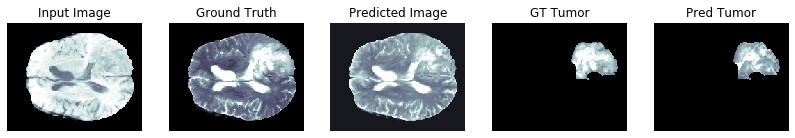

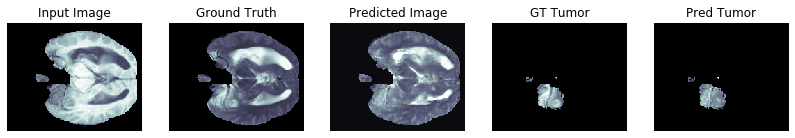

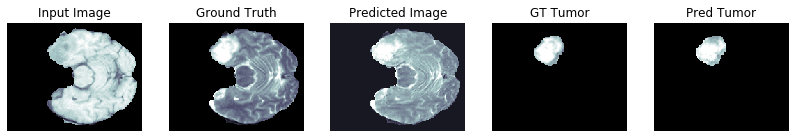

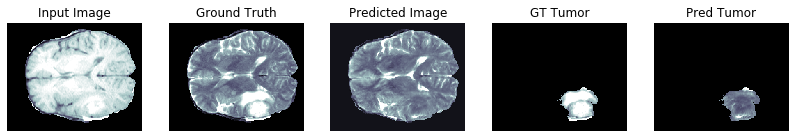

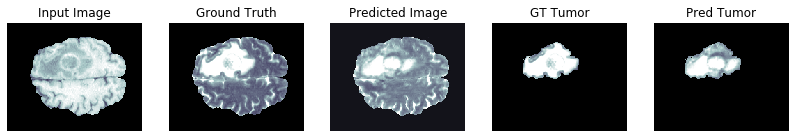

PSNR on validation set: 21.6148 ± 3.7794
MSE on validation set: 0.0091 ± 0.0063
SSIM on validation set: 0.7752 ± 0.1102

PSNR wrt tumor area on validation set: 30.8824 ± 11.3494
MSE wrt tumor area on validation set: 0.0028 ± 0.0035
SSIM wrt tumor area on validation set: 0.9507 ± 0.0480

Generator loss on validation set: 2.3010 ± 0.9916
Discriminator loss on validation set: 1.7188 ± 0.0812

Time taken for epoch 70 is 421.9566984176636 sec

Saving FINAL checkpoint for epoch 70 at ./drive/My Drive/checkpoints/train2/ckpt-10


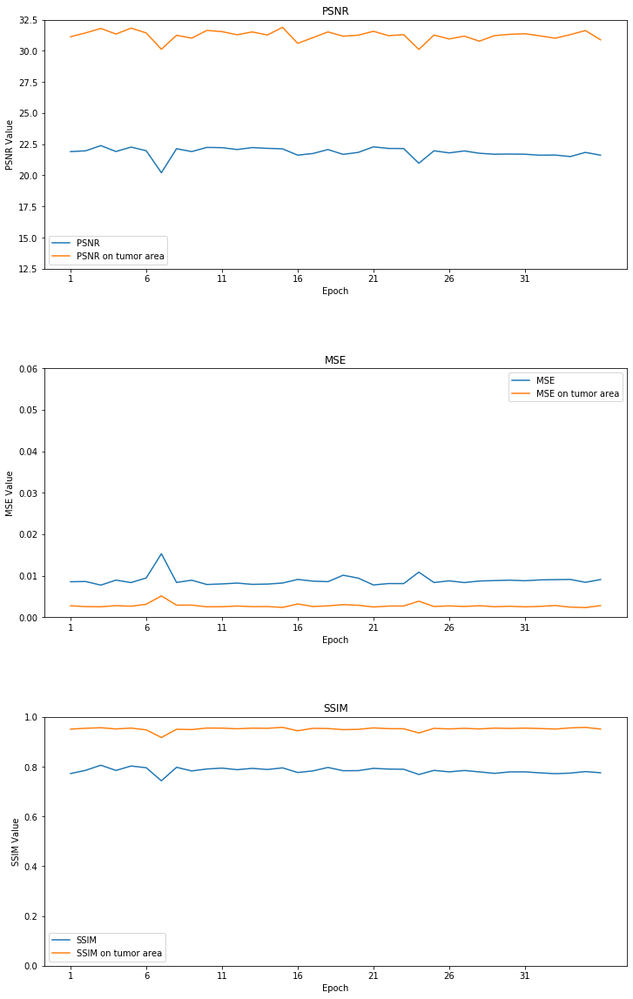

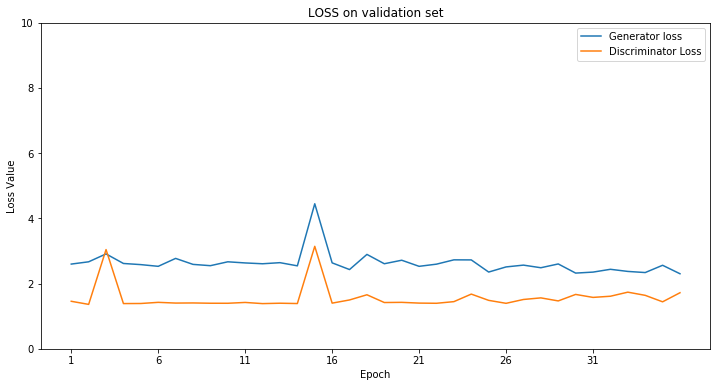

In [41]:
EPOCHS = 35
save_checkpoint = True         # want to save new checkpoints ? 
save_final_models = True       # want to save the model at the end of the training ? 
epochs_already_trained = 35      # this is just for the print. 
evaluate_tumor_quality = True   # compute & print metrics on tumor area ?
print_loss = True               # compute & print the validation loss ?


# Initialize the models, so that I don't have to restart the runtime again.

if tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, False):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)

elif tf.equal(evaluate_tumor_quality, False) and tf.equal(print_loss, True):
    psnr, mse, ssim, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)
    plot_loss(gen_loss, dis_loss)

elif tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, True):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                        epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)
    plot_loss(gen_loss, dis_loss)
else:
    psnr, mse, ssim = fit(training, EPOCHS, validation, save_checkpoint, 
                                                      epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)

# at the end, I'll save the models (I would need only the gen, but let's sayve also the disc  )
# (it saves the entire model to a HDF5 file)

if save_final_models:
    generator.save('drive/My Drive/MRI-generation/gen_T2_70ep.h5')

##Evaluating the final model with the test set

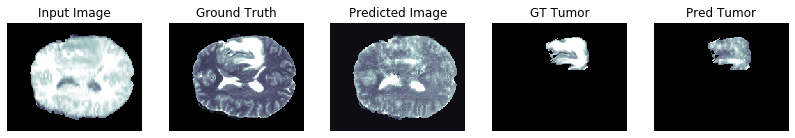

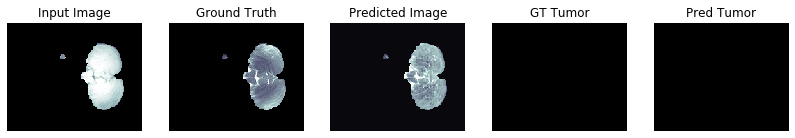

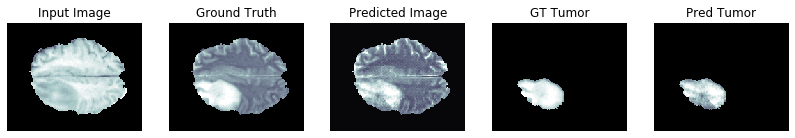

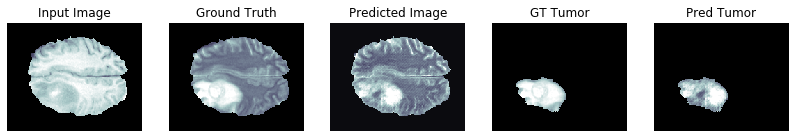

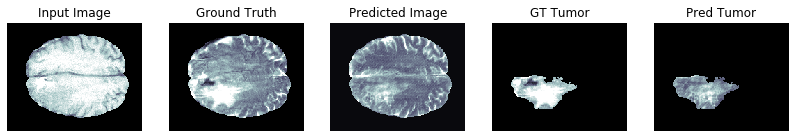

PSNR on test set: 21.5639 ± 3.9366
MSE on test set: 0.0096 ± 0.0073
SSIM on test set: 0.7459 ± 0.1301

PSNR wrt tumor area on test set: 30.1492 ± 11.8962
MSE wrt tumor area on test set: 0.0028 ± 0.0031
SSIM wrt tumor area on test set: 0.9464 ± 0.0480

Generator loss on test set: 2.8542 ± 0.5737
Discriminator loss on test set: 1.4620 ± 0.0166


(<tf.Tensor: shape=(), dtype=float32, numpy=21.563932>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.009605348>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.7458917>,
 <tf.Tensor: shape=(), dtype=float32, numpy=30.149174>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002755372>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.94644946>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.8541603>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4620405>)

In [40]:
# Let's check the scores of this model.

evaluate_GAN(generator, testing, 'test', True, True)

In [0]:
PSNR on test set: 21.5639 ± 3.9366
MSE on test set: 0.0096 ± 0.0073
SSIM on test set: 0.7459 ± 0.1301

PSNR wrt tumor area on test set: 30.2452 ± 12.6697
MSE wrt tumor area on test set: 0.0028 ± 0.0031
SSIM wrt tumor area on test set: 0.9464 ± 0.0480

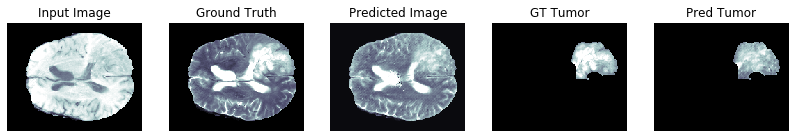

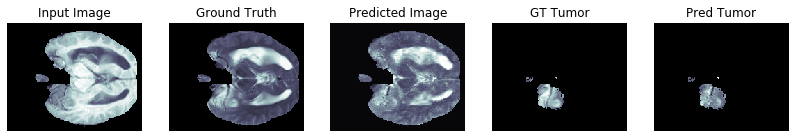

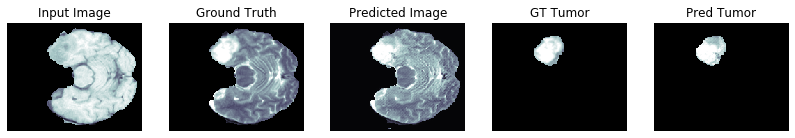

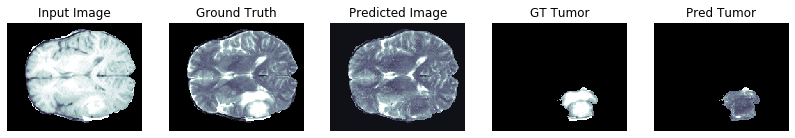

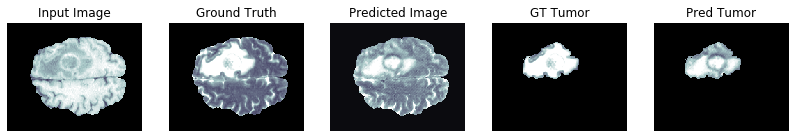

PSNR on validation set: 21.9011 ± 3.8247
MSE on validation set: 0.0085 ± 0.0060
SSIM on validation set: 0.7719 ± 0.1147

PSNR wrt tumor area on validation set: 31.1287 ± 12.5418
MSE wrt tumor area on validation set: 0.0028 ± 0.0035
SSIM wrt tumor area on validation set: 0.9504 ± 0.0487

Generator loss on validation set: 2.5975 ± 1.0035
Discriminator loss on validation set: 1.4567 ± 0.0333


(<tf.Tensor: shape=(), dtype=float32, numpy=21.901085>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008548103>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.7719031>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.12871>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.0027539323>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95037156>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.5975351>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4566851>)

In [41]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

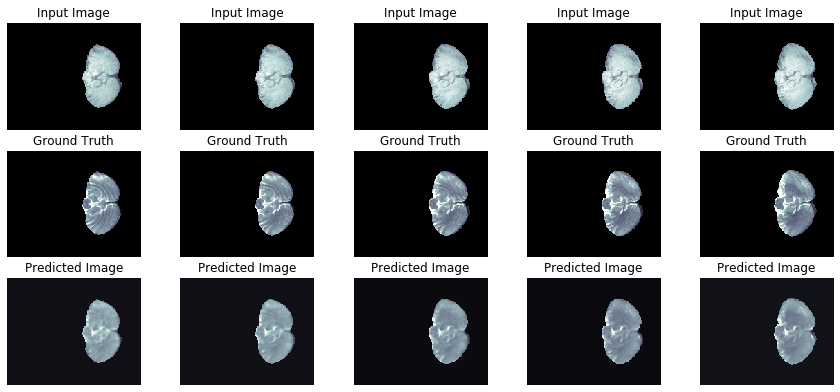


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.5274 ± 12.9959
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6157 ± 1.0658
Discriminator loss on validation set: 1.3909 ± 0.0141


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.527384>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6156569>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.3908572>)

In [93]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

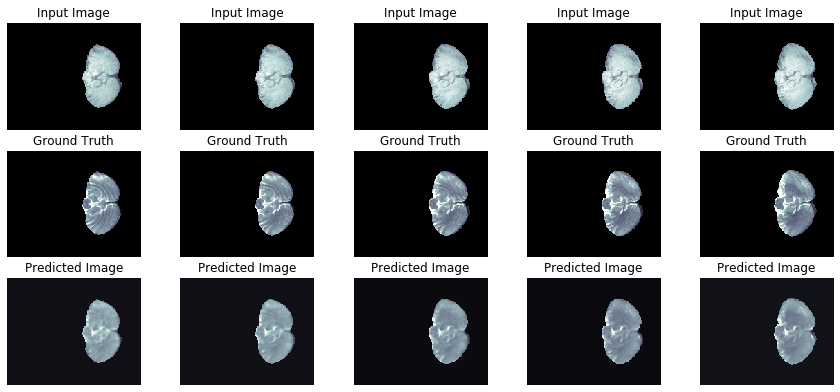


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.5274 ± 12.9959
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6157 ± 1.0658
Discriminator loss on validation set: 1.3909 ± 0.0141


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120826>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.527384>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6156569>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.3908572>)

In [94]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

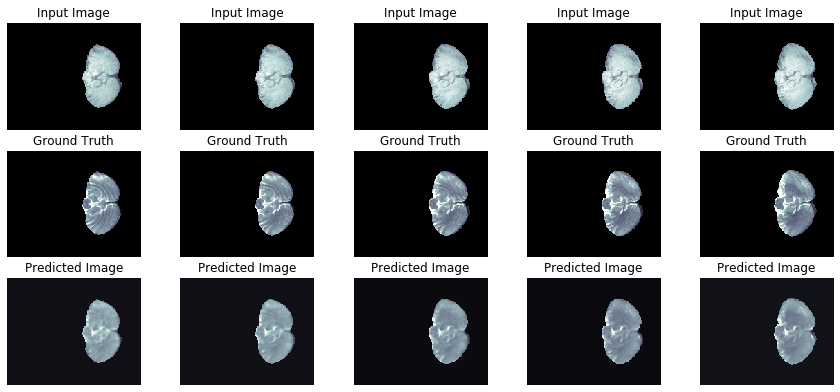


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.5274 ± 12.9959
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6445 ± 1.0748
Discriminator loss on validation set: 1.4045 ± 0.0117


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.527384>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6445024>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4045321>)

In [96]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

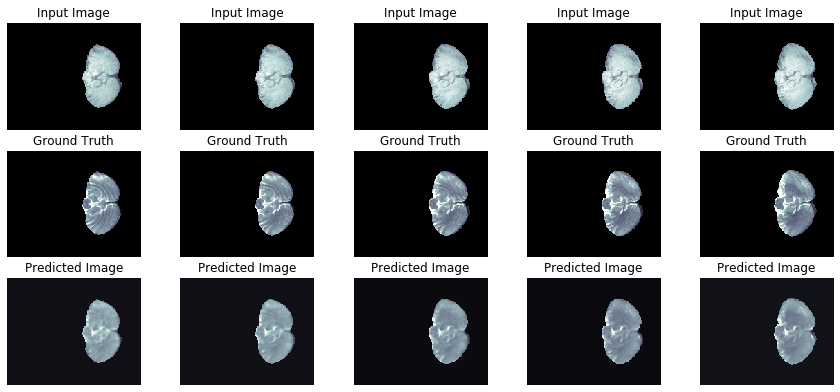


PSNR on validation set: 22.1073 ± 4.0440
MSE on validation set: 0.0085 ± 0.0066
SSIM on validation set: 0.8012 ± 0.1050

PSNR wrt tumor area on validation set: 31.4163 ± 12.1272
MSE wrt tumor area on validation set: 0.0028 ± 0.0040
SSIM wrt tumor area on validation set: 0.9522 ± 0.0510

Generator loss on validation set: 2.6445 ± 1.0748
Discriminator loss on validation set: 1.4045 ± 0.0117


(<tf.Tensor: shape=(), dtype=float32, numpy=22.107252>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.008504067>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.80120814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=31.416317>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.002845238>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.95223486>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.6445024>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.4045321>)

In [97]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

## Considerations about metrics and normalization

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

In [0]:
for raw_record in testing.take(1):
    inp, ground_truth = take_images_from_raw(raw_record)

    prediction = generator(inp, training=False)
    inp, ground_truth, prediction = resize_with_crop(inp, ground_truth, prediction)

    prediction_normalized = mean_normalize(prediction)
    ground_truth_normalized = mean_normalize(ground_truth) 

    #prediction_normalized2 = min_max_normalize(prediction)
    
    # remove black images from ground_truth is not that necessary because it's enough to do it on the predictions. 
    # Anyway, just to be sure, let's remove them also from the ground truth (so the metrics of those images will be ignored)

    # BLACK IMAGES ARE DISCARDED IN ALL THE METRICS COMPUTED. Both in the case where I normalize and in the one in which I don't.
    # What if, in the case in which I don't normalize, I keep the black images? We would have significant differences.
    # For example PSNR would be 27.0207 ± 10.2544 instead of  25.2498 ± 2.8603 (with the model trained)
    ground_truth = black_images_to_nan(ground_truth)
    prediction = black_images_to_nan(prediction)

    #mean, std, psnr = compute_psnr(ground_truth, prediction_normalized2)
    #print("PSNR w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth_normalized, prediction_normalized)
    print("PSNR w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth, prediction)
    print("PSNR: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, ssim = compute_ssim(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth_normalized, prediction_normalized)
    print("SSIM w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth, prediction)
    print("SSIM: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, mse = compute_mse(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth_normalized, prediction_normalized)
    print("MSE w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth, prediction)
    print("MSE: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))

## Additional notes

In [0]:
# in the testing there are 28 patients so 128*28 = 3584 samples
# with a batch_size of 32, we have 112 elements in the prefetched TEST set so 3584 samples.
# in the VALIDATION SET: 108 elements * 32 (batch_size) = 3456 samples.
# in the TRAINING set: 876 elements * 32 = 28032

# each samples has then all the scans defined in the load_dataset (up to 4 scans + the segmented area)
# if batch size is set to 32, then there are less then 100 samples.

# training: with GPU it crashes, with TPU works. a bit more of 28000 samples -> 219 patients * 128 levels.

# training with 100 samples, batch size = 1 and TPU took 46 seconds
# training with 100 samples, batch size = 1 and GPU took 7/8 seconds

# training with 1000 samples, batch size = 1, resizing to 256, GPU took 54 seconds
# training with 1000 samples, batch size = 1, padding to 256, GPU took 52 seconds

# TRAINING TIMES WITH DIFFERENT BATCH SIZES:
# training with 16 samples and batch size = 64 (so 1024 samples fed to the GAN), TPU took 209 seconds

# training with 1000 samples and batch size = 1 (so 1000 samples fed to the GAN), GPU took about 490 seconds (8 min)
# training with 250 samples and bs = 4 (so 1000 samples fed to the GAN), GPU took 127 seconds!
# training with 128 samples and bs = 8 (so 1024 samples fed to the GAN), GPU took 75 seconds!
# training with 64 samples and bs = 16 (so 1024 samples fed to the GAN), GPU took 41 seconds!
# training with 31 samples and bs = 32 (so still 992 samples fed to the GAN), GPU took 28/32/33
# training with 16 samples and bs = 64 (so 1024 samples fed to the GAN), GPU took 23/25/26 seconds!

# training with 8 samples and bs = 128, GPU took 24/25( 21 in the most recent) sec! -> not so good quality
# (It has been observed in practice that when using a larger batch there is a significant degradation in the 
# quality of the model, as measured by its ability to generalize.)
# https://stats.stackexchange.com/questions/164876/tradeoff-batch-size-vs-number-of-iterations-to-train-a-neural-network

# The resulting model may not generalize as well as a model trained with a small batch size

# tradeoff between 32 and 64. 32 seems to be qualitatively more accurate but it's a bit slower. 
# before choosing, it would be better to implement also the quantitative metrics.

# from pix2pix paper: use batch sizes between 1 and 10 depending on the experiment


# In general, batch size of 32 is a good starting point, and you should also try with 64, 128, and 256. 
# Other values (lower or higher) may be fine for some data sets, but the given range is generally the best to 
# start experimenting with. Though, under 32, it might get too slow because of significantly lower computational speed, 
# because of not exploiting vectorization to the full extent.  
# If you get an "out of memory" error, you should try reducing the mini-batch size anyway.


# training with 4 samples and bs = 256, GPU run out of memory. Resource exhausted.

In [0]:
# np.FUNCTION VS tf.FUNCTION

# np =  training with 31 samples and bs = 32 (992 samples fed to the GAN), GPU took 28/32/33
# training with 32 samples and bs = 32 (1024 samples fed to the GAN), GPU took 14/15/16/17 seconds 